# All oscillation analysis

Brief 1-2 sentence description of notebook.

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import collections
import itertools
from collections import defaultdict

In [3]:
# Imports of all used packages and libraries
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import mannwhitneyu

In [4]:
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import colorsys

In [5]:
from sklearn.metrics import confusion_matrix

In [6]:
from spectral_connectivity import Multitaper, Connectivity
import spectral_connectivity

In [7]:
FONTSIZE = 20

In [8]:
font = {'weight' : 'medium',
        'size'   : 20}

matplotlib.rc('font', **font)

## Inputs & Data

Explanation of each input and where it comes from.

In [9]:
# Inputs and Required data loading
# input varaible names are in all caps snake case
# Whenever an input changes or is used for processing 
# the vairables are all lower in snake case
OUTPUT_DIR = r"./proc" # where data is saved should always be shown in the inputs

In [10]:
CHANNEL_MAP_AND_ALL_TRIALS_DF = pd.read_pickle("./proc/full_baseline_and_trial_lfp_traces.pkl")
MERGED_TRIALS_AND_VIDEO = pd.read_pickle("./proc/trial_SLEAP_and_metadata.pkl")

In [11]:
OUTCOME_TO_COLOR = {'lose': "red",
 'omission': "orange",
 'rewarded': "green",
 'win': "blue"}

OUTCOME_TO_COLOR = {'lose': "#951a1d",
 'omission': "#af780d",
 'rewarded': "#0499af",
 'win': "#3853a3"}

In [12]:
OUTCOME_COMPARISONS = {"win_lose": ("win", "lose"), "lose_omission": ("lose", "omission"), "win_rewarded": ("win", "rewarded")}

In [13]:
TRIAL_OR_BASELINE_TO_STYLE = {'baseline': "--", "trial": "-"}

In [14]:
TIME_HALFBANDWIDTH_PRODUCT = 2
TIME_WINDOW_DURATION = 1
TIME_WINDOW_STEP = 0.5
RESAMPLE_RATE=1000

In [15]:
BIN_TO_VELOCITY = {0: "0 to 2.5cm/s", 1: "2.5 to 5cm/s", 2: "5 to 10 cm/s", 3: "10cm/s+"}

In [16]:
MIN_VELOCITY = 0
MAX_VELOCITY = 2.5

In [119]:
MIN_DISTANCE = 0
MAX_DISTANCE = 5

In [17]:
ALL_BANDS = ["theta", "beta", "gamma"]
BAND_TO_FREQ = {"theta": {"low_freq": 6, "high_freq": 11}, "beta": {"low_freq": 20, "high_freq": 31}, "gamma": {"low_freq": 30, "high_freq": 51}}
BAND_TO_FREQ = {"theta": (6,11), "beta": (20,31), "gamma": (30,51)}

In [18]:
GROUPINGS = "trial_outcome"

In [19]:
FONTSIZE=20

In [20]:
MERGED_TRIALS_AND_VIDEO.head()

,time,recording_dir,recording_file,time_stamp_index,video_file,video_frame,video_number,subject_info,competition_closeness,video_name,...,baseline-trial_subject_thorax-to-agent_distance_chunked,baseline_subject_thorax-to-agent_distance_binned,trial_subject_thorax-to-agent_distance_binned,baseline-trial_subject_thorax-to-agent_distance_binned,baseline_subject-agent_to-reward-port-distance-ratio_chunked,trial_subject-agent_to-reward-port-distance-ratio_chunked,baseline-trial_subject-agent_to-reward-port-distance-ratio_chunked,baseline_subject-agent_to-reward-port-distance-ratio_binned,trial_subject-agent_to-reward-port-distance-ratio_binned,baseline-trial_subject-agent_to-reward-port-distance-ratio_binned
0,4509412,20230617_115521_standard_comp_to_omission_D1_s...,20230617_115521_standard_comp_to_omission_D1_s...,1030879,20230617_115521_standard_comp_to_omission_D1_s...,1029,1.0,1-1_t1b3L_box1,lose_comp,20230617_115521_standard_comp_to_omission_D1_s...,...,"[12.65717198847138, 12.683871307928696, 14.880...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1.0759253122165384, 1.0769129973530136, 1.076...","[8.855775558856838, 8.071331610027782, 6.34917...","[1.0759253122165384, 1.0769129973530136, 1.076...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, ...","[1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, ..."
1,6909411,20230617_115521_standard_comp_to_omission_D1_s...,20230617_115521_standard_comp_to_omission_D1_s...,3430878,20230617_115521_standard_comp_to_omission_D1_s...,3425,1.0,1-1_t1b3L_box1,win_comp,20230617_115521_standard_comp_to_omission_D1_s...,...,"[25.320573976061063, 25.371420577329687, 25.41...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[12.812376711482205, 12.737960036445987, 12.61...","[5.900235036905437, 5.7618199879648, 5.5222346...","[12.812376711482205, 12.737960036445987, 12.61...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
2,9209413,20230617_115521_standard_comp_to_omission_D1_s...,20230617_115521_standard_comp_to_omission_D1_s...,5730880,20230617_115521_standard_comp_to_omission_D1_s...,5720,1.0,1-1_t1b3L_box1,win_comp,20230617_115521_standard_comp_to_omission_D1_s...,...,"[10.449518193779662, 10.328848927104168, 9.348...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1.3140549404066315, 2.083627429990607, 1.9285...","[0.14051079708270506, 0.2589369756582887, 0.40...","[1.3140549404066315, 2.083627429990607, 1.9285...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,13109412,20230617_115521_standard_comp_to_omission_D1_s...,20230617_115521_standard_comp_to_omission_D1_s...,9630879,20230617_115521_standard_comp_to_omission_D1_s...,9612,1.0,1-1_t1b3L_box1,win_comp,20230617_115521_standard_comp_to_omission_D1_s...,...,"[22.46126034089424, 15.271962513097026, 9.7552...","[1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, ...","[10.605771942059523, 7.690197343693041, 5.6453...","[0.33382427611833676, 0.36024075728364263, 0.2...","[10.605771942059523, 7.690197343693041, 5.6453...","[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,16509409,20230617_115521_standard_comp_to_omission_D1_s...,20230617_115521_standard_comp_to_omission_D1_s...,13030876,20230617_115521_standard_comp_to_omission_D1_s...,13006,1.0,1-1_t

In [21]:
CHANNEL_MAP_AND_ALL_TRIALS_DF.head()

,time,recording_dir,recording_file,time_stamp_index,video_file,video_frame,video_number,subject_info,competition_closeness,video_name,...,vHPC_baseline-trial_lfp_trace,BLA_baseline_lfp_trace,BLA_trial_lfp_trace,BLA_baseline-trial_lfp_trace,LH_baseline_lfp_trace,LH_trial_lfp_trace,LH_baseline-trial_lfp_trace,MD_baseline_lfp_trace,MD_trial_lfp_trace,MD_baseline-trial_lfp_trace
0,6310663,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,1390826,20221202_134600_omission_and_competition_subje...,1734,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[-0.07045184, -0.0958607, -0.054282565, 0.1512...","[2.0367692, 2.1165679, 2.162167, 2.2685654, 2....","[0.31159526, 0.35909453, 0.18239723, -0.509192...","[2.0367692, 2.1165679, 2.162167, 2.2685654, 2....","[3.0443187, 3.1354659, 3.1810396, 3.1901543, 3...","[0.78082824, 1.1788379, 0.8415931, -0.40104795...","[3.0443187, 3.1354659, 3.1810396, 3.1901543, 3...","[1.3860394, 1.4873364, 1.7566382, 1.8208753, 1...","[-0.9857927, -0.8746131, -0.7362562, -1.413216...","[1.3860394, 1.4873364, 1.7566382, 1.8208753, 1..."
1,7910662,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,2990825,20221202_134600_omission_and_competition_subje...,3728,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[0.30606127, 0.22405995, 0.28873706, 0.4100066...","[0.30589536, 0.13679792, -0.064599015, -0.3381...","[0.020899683, -0.05129922, 0.113998264, -0.416...","[0.30589536, 0.13679792, -0.064599015, -0.3381...","[-1.1575702, -1.2699852, -1.3489795, -1.427973...","[0.91754913, 0.4466216, 0.64410734, 0.03342066...","[-1.1575702, -1.2699852, -1.3489795, -1.427973...","[-0.15318082, -0.16800477, 0.019765267, 0.1605...","[1.620752, 1.3415675, 1.4601592, 0.94132084, -...","[-0.15318082, -0.16800477, 0.019765267, 0.1605..."
2,9710660,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,4790823,20221202_134600_omission_and_competition_subje...,5972,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[-1.2300198, -1.2323297, -1.3039365, -1.096045...","[-2.0025697, -1.9151709, -1.9436705, -1.552276...","[0.6896895, 1.3983787, 1.7574733, 1.4287783, 1...","[-2.0025697, -1.9151709, -1.9436705, -1.552276...","[-0.20356221, -0.08203254, -0.18837102, -0.142...","[-0.58941895, 0.25521234, 0.66233677, 0.416239...","[-0.20356221, -0.08203254, -0.18837102, -0.142...","[-0.32859758, -0.5361329, -0.97591007, -0.7609...","[0.088943705, 0.8770837, 1.2056813, 0.88696635...","[-0.32859758, -0.5361329, -0.97591007, -0.7609..."
3,11310658,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,6390821,20221202_134600_omission_and_competition_subje...,7966,1.0,6_1_top_2_base_3,omission,20221202_134600_omission_and_competition_subje...,...,"[0.1605378, 0.4169363, 0.64561605, 0.6756447, ...","[-1.2729807, -1.0468841, -0.8378873, -0.754288...","[2.6789594, 2.3939636, 2.2096665, 1.97597, 1.8...","[-1.2729807, -1.0468841, -0.8378873, -0.754288...","[-2.4792056, -2.1480372, -1.8259835, -1.677109...","[2.7587237, 2.233108, 1.4796239, 0.93274033, 1...","[-2.4792056, -2.1480372, -1.8259835, -1.677109...","[-2.7720788, -2.5620728, -2.3125362, -2.062999...","[2.0802944, 1.7344022, 1.1192082, 0.4521305, 0...","[-2.7720788, -2.5620728, -2.3125362, -2.062999..."
4,12810657,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,7890820,20221202_134600_omission_and_competition_subje...,9836,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[-0.30952612, 0.19056645, 0.4331056, 0.3638087...","[-2.1469674, -2.0690687, -2.0937681, -2.152667...","[-0.18809713, 0.108298354, -0.66878986, -0.944...","[-2.1469674, -2.0690687, -2.0937681, -2.152667...","[-2.1176548, -1.4522797, -1.0360405, -1.108958

## Outputs

Describe each output that the notebook creates. 

- Is it a plot or is it data?

- How valuable is the output and why is it valuable or useful?

## Functions 

In [22]:
def generate_pairs(lst):
    pairs = []
    n = len(lst)
    for i in range(n):
        for j in range(i+1, n):
            pairs.append((lst[i], lst[j]))
    return pairs

In [23]:
def nested_dict():
    return defaultdict(dict)

In [24]:
def mean_of_counter(counter):
    # Extract values from the Counter and calculate the mean
    values = list(counter.values())
    return sum(values) / len(values) if values else 0  # Prevent division by zero

In [25]:
def adjust_lightness(color, amount=0.5):
    """
    Adjusts the lightness of the given color by the provided amount.
    :param color: Input color in some format that matplotlib's `to_rgb` can handle.
    :param amount: Amount to adjust. > 1 for lighter, < 1 for darker.
    :return: Adjusted color.
    """
    import colorsys
    c = mcolors.to_rgb(color)
    h, l, s = colorsys.rgb_to_hls(*c)
    return colorsys.hls_to_rgb(h, max(0, min(1, amount * l)), s)

In [26]:
def generate_gradient_colors(base_color, num_colors=10):
    """
    Generate gradient colors based on a base color.
    
    :param base_color: The base color to create a gradient from.
    :param num_colors: The number of gradient colors to generate.
    :return: List of colors.
    """
    # Convert base color to HLS (Hue, Lightness, Saturation)
    h, l, s = colorsys.rgb_to_hls(*mcolors.to_rgb(base_color))

    # Determine the step size for lightness
    middle_index = num_colors // 2
    lightness_step = l / (middle_index if middle_index > 0 else 1)

    colors = []
    for i in range(num_colors):
        if i < middle_index:
            # For the lighter colors (before the middle)
            new_lightness = l + (middle_index - i) * lightness_step
        elif i == middle_index:
            # The middle color remains the base color
            new_lightness = l
        else:
            # For the darker colors (after the middle)
            new_lightness = l - (i - middle_index) * lightness_step

        # Ensure new lightness is within the valid range [0, 1]
        new_lightness = max(0, min(new_lightness, 1))

        new_color = colorsys.hls_to_rgb(h, new_lightness, s)
        colors.append(new_color)

    return colors

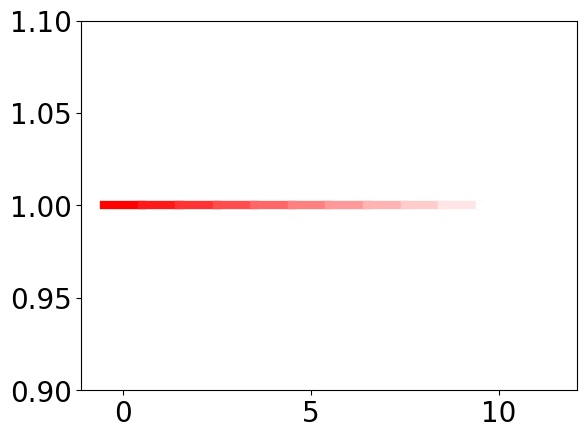

In [27]:
# Original color
original_color = 'red'  # Can be any color matplotlib understands

# Generate lighter versions
lighter_colors = [adjust_lightness(original_color, amount=1+(0.1*i)) for i in range(12)]

# Plotting to demonstrate the colors
for i, color in enumerate(lighter_colors):
    plt.plot([i-0.5, i+0.5], [1, 1], color=color, linewidth=6)  

plt.ylim(0.9, 1.1)
plt.show()

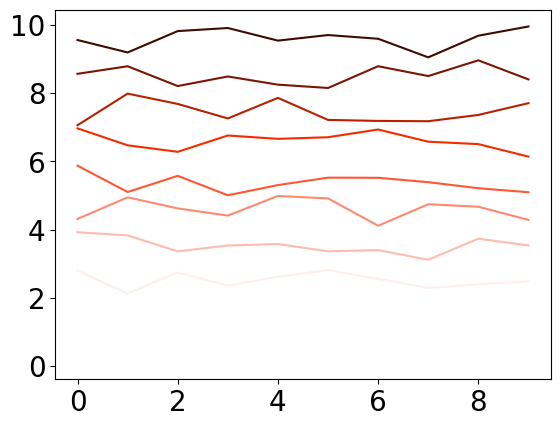

In [28]:
# Base color
base_color = '#ff5733'  # Reddish color

# Number of colors you want in the gradient
num_colors = 10

# Generate gradient colors
gradient_colors = generate_gradient_colors(base_color, num_colors)

# Set the color cycle to use the gradient colors
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=gradient_colors)

# Test by plotting some data
for i in range(num_colors):
    plt.plot(np.arange(10), np.random.rand(10) + i)

plt.show()

## Processing

Describe what is done to the data here and how inputs are manipulated to generate outputs. 

In [29]:
# As much code and as many cells as required
# includes EDA and playing with data
# GO HAM!

# Ideally functions are defined here first and then data is processed using the functions

# function names are short and in snake case all lowercase
# a function name should be unique but does not have to describe the function
# doc strings describe functions not function names




In [30]:
CHANNEL_MAP_AND_ALL_TRIALS_DF.columns

Index(['time', 'recording_dir', 'recording_file', 'time_stamp_index',
       'video_file', 'video_frame', 'video_number', 'subject_info',
       'competition_closeness', 'video_name', 'all_subjects',
       'current_subject', 'trial_outcome', 'lfp_index',
       'baseline_lfp_timestamp_range', 'trial_lfp_timestamp_range',
       'baseline_ephys_timestamp_range', 'trial_ephys_timestamp_range',
       'baseline_videoframe_range', 'trial_videoframe_range', 'trial_number',
       'Cohort', 'mPFC_baseline_lfp_trace', 'mPFC_trial_lfp_trace',
       'mPFC_baseline-trial_lfp_trace', 'vHPC_baseline_lfp_trace',
       'vHPC_trial_lfp_trace', 'vHPC_baseline-trial_lfp_trace',
       'BLA_baseline_lfp_trace', 'BLA_trial_lfp_trace',
       'BLA_baseline-trial_lfp_trace', 'LH_baseline_lfp_trace',
       'LH_trial_lfp_trace', 'LH_baseline-trial_lfp_trace',
       'MD_baseline_lfp_trace', 'MD_trial_lfp_trace',
       'MD_baseline-trial_lfp_trace'],
      dtype='object')

In [31]:
MERGED_TRIALS_AND_VIDEO.columns

Index(['time', 'recording_dir', 'recording_file', 'time_stamp_index',
       'video_file', 'video_frame', 'video_number', 'subject_info',
       'competition_closeness', 'video_name', 'all_subjects',
       'current_subject', 'trial_outcome', 'lfp_index',
       'baseline_lfp_timestamp_range', 'trial_lfp_timestamp_range',
       'baseline_ephys_timestamp_range', 'trial_ephys_timestamp_range',
       'baseline_videoframe_range', 'trial_videoframe_range', 'trial_number',
       'Cohort', 'spike_interface_mPFC', 'spike_interface_vHPC',
       'spike_interface_BLA', 'spike_interface_LH', 'spike_interface_MD',
       'file_path', 'start_frame', 'stop_frame', 'individual_subj', 'all_subj',
       'recording_name', 'track_names', 'subject_and_tracks_list',
       'subject_id', 'agent_id', 'corner_path', 'corner_parts', 'bottom_width',
       'top_width', 'right_height', 'left_height', 'average_height',
       'average_width', 'width_ratio', 'height_ratio', 'box_bottom_left',
       'reward_po

### Merging LFP Trace dataframe and SLEAP pose tracking

In [32]:
merge_columns = ["time", "recording_file", "current_subject", "video_number"]
# Find columns in df2 that are not in merge_columns and also exist in df1, then drop them from df2
cols_to_drop = [col for col in CHANNEL_MAP_AND_ALL_TRIALS_DF.columns if col not in merge_columns and col in MERGED_TRIALS_AND_VIDEO.columns]
CHANNEL_MAP_AND_ALL_TRIALS_DF = CHANNEL_MAP_AND_ALL_TRIALS_DF.drop(columns=cols_to_drop)

In [33]:
MERGED_LFP_AND_SLEAP = pd.merge(left=CHANNEL_MAP_AND_ALL_TRIALS_DF, right=MERGED_TRIALS_AND_VIDEO, on=merge_columns, how="right")

In [34]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,mPFC_baseline-trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,vHPC_baseline-trial_lfp_trace,...,baseline-trial_subject_thorax-to-agent_distance_chunked,baseline_subject_thorax-to-agent_distance_binned,trial_subject_thorax-to-agent_distance_binned,baseline-trial_subject_thorax-to-agent_distance_binned,baseline_subject-agent_to-reward-port-distance-ratio_chunked,trial_subject-agent_to-reward-port-distance-ratio_chunked,baseline-trial_subject-agent_to-reward-port-distance-ratio_chunked,baseline_subject-agent_to-reward-port-distance-ratio_binned,trial_subject-agent_to-reward-port-distance-ratio_binned,baseline-trial_subject-agent_to-reward-port-distance-ratio_binned
0,4509412,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[-1.2365645, -1.3354121, -1.5621803, -1.494343...","[-1.0679421, -0.7713992, -0.69580984, -1.13190...","[-1.2365645, -1.3354121, -1.5621803, -1.494343...","[0.20910755, 0.39620376, 0.7075067, 1.040821, ...","[-2.4841347, -2.1523926, -1.564376, -1.139872,...","[0.20910755, 0.39620376, 0.7075067, 1.040821, ...",...,"[12.65717198847138, 12.683871307928696, 14.880...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1.0759253122165384, 1.0769129973530136, 1.076...","[8.855775558856838, 8.071331610027782, 6.34917...","[1.0759253122165384, 1.0769129973530136, 1.076...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, ...","[1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, ..."
1,6909411,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[0.24421181, 0.2616555, 0.4380307, 0.4729181, ...","[-0.8605559, -0.6492933, -0.37407047, -0.05233...","[0.24421181, 0.2616555, 0.4380307, 0.4729181, ...","[0.5377051, 0.70907897, 0.5219827, 0.3506089, ...","[-0.31916416, -0.08647305, 0.19810188, 0.49525...","[0.5377051, 0.70907897, 0.5219827, 0.3506089, ...",...,"[25.320573976061063, 25.371420577329687, 25.41...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[12.812376711482205, 12.737960036445987, 12.61...","[5.900235036905437, 5.7618199879648, 5.5222346...","[12.812376711482205, 12.737960036445987, 12.61...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ..."
2,9209413,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[1.7249881, 1.7424319, 1.6862243, 1.4323217, 0...","[-0.094971254, -0.16862243, -0.12404409, -0.22...","[1.7249881, 1.7424319, 1.6862243, 1.4323217, 0...","[0.7531016, 0.1776628, -0.37890917, -0.6980733...","[1.2908068, 1.0486822, 0.79712427, 0.55971646,...","[0.7531016, 0.1776628, -0.37890917, -0.6980733...",...,"[10.449518193779662, 10.328848927104168, 9.348...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1.3140549404066315, 2.083627429990607, 1.9285...","[0.14051079708270506, 0.2589369756582887, 0.40...","[1.3140549404066315, 2.083627429990607, 1.9285...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,13109412,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[-0.89156693, -1.0485603, -0.7539555, -0.38182...","[2.3956015, 2.1804626, 1.9730763, 1.9750146, 2...","[-0.89156693, -1.0485603, -0.7539555, -0.38182...","[-0.72480136, -0.8631582, -0.610028, 0.1776628...","[2.0847864, 1.889829, 1.8442342, 1.9480019, 2....","[-0.72480136, -0.8631582, -0.610028, 0.1776628...",...,"[22.46126034089424, 15.271962513097026, 9.7552...","[1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, ...","[0, 0, 0, 0, 0, 0, 

In [35]:
trace_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "trace" in col]

In [36]:
trial_trace_columns = sorted([col for col in MERGED_LFP_AND_SLEAP.columns if "trial_lfp_trace" in col])
baseline_trace_columns = sorted([col for col in MERGED_LFP_AND_SLEAP.columns if "baseline_lfp_trace" in col])

In [37]:
trial_trace_columns

['BLA_baseline-trial_lfp_trace',
 'BLA_trial_lfp_trace',
 'LH_baseline-trial_lfp_trace',
 'LH_trial_lfp_trace',
 'MD_baseline-trial_lfp_trace',
 'MD_trial_lfp_trace',
 'mPFC_baseline-trial_lfp_trace',
 'mPFC_trial_lfp_trace',
 'vHPC_baseline-trial_lfp_trace',
 'vHPC_trial_lfp_trace']

## Power Calcuation

- Calcuating the power at each frequency band

In [38]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_multitaper".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_lfp_trace".format(region_and_baseline_or_trial)].apply(lambda x: Multitaper(time_series=x, sampling_frequency=RESAMPLE_RATE, time_halfbandwidth_product=TIME_HALFBANDWIDTH_PRODUCT,                                                                              time_window_duration=TIME_WINDOW_DURATION, time_window_step=TIME_WINDOW_STEP                                                                                                                                         ))

In [39]:
for col in trace_columns:
    print(col)
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_multitaper".format(region_and_baseline_or_trial)].apply(lambda x: Connectivity.from_multitaper(x))

mPFC_baseline_lfp_trace
mPFC_trial_lfp_trace
mPFC_baseline-trial_lfp_trace
vHPC_baseline_lfp_trace
vHPC_trial_lfp_trace
vHPC_baseline-trial_lfp_trace
BLA_baseline_lfp_trace
BLA_trial_lfp_trace
BLA_baseline-trial_lfp_trace
LH_baseline_lfp_trace
LH_trial_lfp_trace
LH_baseline-trial_lfp_trace
MD_baseline_lfp_trace
MD_trial_lfp_trace
MD_baseline-trial_lfp_trace


In [40]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_frequencies".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)].apply(lambda x: x.frequencies)

In [41]:
for col in trace_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_power_all-window".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP["{}_connectivity".format(region_and_baseline_or_trial)].apply(lambda x: x.power().squeeze())

In [53]:
MERGED_LFP_AND_SLEAP["{}_power_all-window".format(region_and_baseline_or_trial)].iloc[0].shape

(39, 500)

In [42]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")

In [43]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,mPFC_baseline-trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,vHPC_baseline-trial_lfp_trace,...,vHPC_baseline-trial_power_all-window,BLA_baseline_power_all-window,BLA_trial_power_all-window,BLA_baseline-trial_power_all-window,LH_baseline_power_all-window,LH_trial_power_all-window,LH_baseline-trial_power_all-window,MD_baseline_power_all-window,MD_trial_power_all-window,MD_baseline-trial_power_all-window
0,4509412,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[-1.2365645, -1.3354121, -1.5621803, -1.494343...","[-1.0679421, -0.7713992, -0.69580984, -1.13190...","[-1.2365645, -1.3354121, -1.5621803, -1.494343...","[0.20910755, 0.39620376, 0.7075067, 1.040821, ...","[-2.4841347, -2.1523926, -1.564376, -1.139872,...","[0.20910755, 0.39620376, 0.7075067, 1.040821, ...",...,"[[0.06577321988470483, 0.052082635879580154, 0...","[[0.04846414060565818, 0.03825064948044874, 0....","[[0.023575046659821245, 0.0259331288137852, 0....","[[0.04846414060565818, 0.03825064948044874, 0....","[[0.027032997418407468, 0.018166732374995893, ...","[[0.01288291485133643, 0.008844910077795138, 0...","[[0.027032997418407468, 0.018166732374995893, ...","[[0.013389447797539401, 0.011412659820189668, ...","[[0.002244466090808307, 0.0025331166319085712,...","[[0.013389447797539401, 0.011412659820189668, ..."
1,6909411,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[0.24421181, 0.2616555, 0.4380307, 0.4729181, ...","[-0.8605559, -0.6492933, -0.37407047, -0.05233...","[0.24421181, 0.2616555, 0.4380307, 0.4729181, ...","[0.5377051, 0.70907897, 0.5219827, 0.3506089, ...","[-0.31916416, -0.08647305, 0.19810188, 0.49525...","[0.5377051, 0.70907897, 0.5219827, 0.3506089, ...",...,"[[0.032539283617105036, 0.08699398469617095, 0...","[[0.0340132424343444, 0.03206636184086895, 0.0...","[[0.002657767852156648, 0.003989197629651639, ...","[[0.0340132424343444, 0.03206636184086895, 0.0...","[[0.008502855173479387, 0.015217701904129594, ...","[[0.03030199158219578, 0.014992747343420865, 0...","[[0.008502855173479387, 0.015217701904129594, ...","[[0.0074992117767994125, 0.016418355320274948,...","[[0.026678488104208267, 0.013914742570160553, ...","[[0.0074992117767994125, 0.016418355320274948,..."
2,9209413,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[1.7249881, 1.7424319, 1.6862243, 1.4323217, 0...","[-0.094971254, -0.16862243, -0.12404409, -0.22...","[1.7249881, 1.7424319, 1.6862243, 1.4323217, 0...","[0.7531016, 0.1776628, -0.37890917, -0.6980733...","[1.2908068, 1.0486822, 0.79712427, 0.55971646,...","[0.7531016, 0.1776628, -0.37890917, -0.6980733...",...,"[[0.035239375118848115, 0.027637486699423487, ...","[[0.012289059066669621, 0.009292139966569149, ...","[[0.0037119450558186517, 0.002619719422275406,...","[[0.012289059066669621, 0.009292139966569149, ...","[[0.03448840301621292, 0.020628671692418846, 0...","[[0.005308566286017989, 0.005874774035704584, ...","[[0.03448840301621292, 0.020628671692418846, 0...","[[0.027042362861995257, 0.017938209005009965, ...","[[0.004514168344374293, 0.006898958492899059, ...","[[0.027042362861995257, 0.017938209005009965, ..."
3,13109412,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[-0.89156693, -1.0485603, -0.7539555, -0.38182...","[2.3956015, 2.1804626, 1.9730763, 1.9750146, 2...","[-0.89156693, -1.0485603, -0.7539555, -0.38182...","[-0.72480136, -0.8631582, -0.610028, 0.1776628...","[2.0847864, 1.889829, 1.8442342, 1.9480019, 2....","[-0.72480136, -0.8631582, -0.610028, 0.1776628...",...,"[[0.009280712523364161, 0.012663323047184746, ...","[[0.0009335891980081169, 0.017256753280199835,...","[[0.038861569247197914, 0.02332519656461228, 0...","[[0.0009335891980081169, 0.017256753280199835,...","[[0.0026066428774081424, 0.0069093357329332765...","[[0.038643923355670504, 0.02162783179648867, 0...","[[0.0026066428774081424, 0.0069093357329332765...","[[0.004787094939777054, 

In [44]:
for col in MERGED_LFP_AND_SLEAP.columns:
    print(col)

time
recording_file
video_number
current_subject
mPFC_baseline_lfp_trace
mPFC_trial_lfp_trace
mPFC_baseline-trial_lfp_trace
vHPC_baseline_lfp_trace
vHPC_trial_lfp_trace
vHPC_baseline-trial_lfp_trace
BLA_baseline_lfp_trace
BLA_trial_lfp_trace
BLA_baseline-trial_lfp_trace
LH_baseline_lfp_trace
LH_trial_lfp_trace
LH_baseline-trial_lfp_trace
MD_baseline_lfp_trace
MD_trial_lfp_trace
MD_baseline-trial_lfp_trace
recording_dir
time_stamp_index
video_file
video_frame
subject_info
competition_closeness
video_name
all_subjects
trial_outcome
lfp_index
baseline_lfp_timestamp_range
trial_lfp_timestamp_range
baseline_ephys_timestamp_range
trial_ephys_timestamp_range
baseline_videoframe_range
trial_videoframe_range
trial_number
Cohort
spike_interface_mPFC
spike_interface_vHPC
spike_interface_BLA
spike_interface_LH
spike_interface_MD
file_path
start_frame
stop_frame
individual_subj
all_subj
recording_name
track_names
subject_and_tracks_list
subject_id
agent_id
corner_path
corner_parts
bottom_width
top_

### Averaging the power for all the windows(without any velocity parsing) 

In [54]:
power_all_window_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "power_all-window" in col and "baseline-trial" not in col]

In [55]:
power_all_window_columns

['mPFC_baseline_power_all-window',
 'mPFC_trial_power_all-window',
 'vHPC_baseline_power_all-window',
 'vHPC_trial_power_all-window',
 'BLA_baseline_power_all-window',
 'BLA_trial_power_all-window',
 'LH_baseline_power_all-window',
 'LH_trial_power_all-window',
 'MD_baseline_power_all-window',
 'MD_trial_power_all-window']

In [56]:
for col in power_all_window_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    print(region_and_baseline_or_trial)
    MERGED_LFP_AND_SLEAP["{}_power_window-averaged".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.array(x[col]).mean(axis=0), axis=1)

mPFC_baseline
mPFC_trial
vHPC_baseline
vHPC_trial
BLA_baseline
BLA_trial
LH_baseline
LH_trial
MD_baseline
MD_trial


In [57]:
MERGED_LFP_AND_SLEAP["{}_power_window-averaged".format(region_and_baseline_or_trial)].iloc[0].shape

(500,)

In [58]:
MERGED_LFP_AND_SLEAP.drop(columns=trace_columns, errors="ignore").to_pickle("./proc/rce_lfp_all-window_power.pkl")


# Parsing by velocity

- Getting a mask for each segment based on velocity

In [50]:
all_bins = set(x for lst in MERGED_LFP_AND_SLEAP["trial_subject_thorax_velocity_binned"] for x in lst)

In [51]:
all_bins

{0, 1, 2, 3}

In [65]:
baseline_power_all_window_columns = [col for col in MERGED_LFP_AND_SLEAP if "baseline_power_all-window" in col and "baseline-trial" not in col]
trial_power_window_averaged_columns = [col for col in MERGED_LFP_AND_SLEAP if "trial_power_all-window" in col and "baseline-trial" not in col]

In [66]:
baseline_power_all_window_columns

['mPFC_baseline_power_all-window',
 'vHPC_baseline_power_all-window',
 'BLA_baseline_power_all-window',
 'LH_baseline_power_all-window',
 'MD_baseline_power_all-window']

In [67]:
MERGED_LFP_AND_SLEAP[baseline_power_all_window_columns[0]].iloc[0].shape

(19, 500)

In [68]:
MERGED_LFP_AND_SLEAP["baseline_subject_thorax-to-reward-port_distance_binned"]

0      [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...
1      [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...
2      [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
3      [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
4      [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
                             ...                        
179    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
180    [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
181    [0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, ...
182    [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, ...
183    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
Name: baseline_subject_thorax-to-reward-port_distance_binned, Length: 184, dtype: object

In [69]:
all_bin_df = []
for bin in all_bins:
    current_df = MERGED_LFP_AND_SLEAP.copy()
    current_df["baseline_velocity_binned-mask"] = current_df["baseline_subject_thorax_velocity_binned"].apply(lambda x: [index for index, num in enumerate(x) if num == bin])
    current_df["trial_velocity_binned-mask"] = current_df["trial_subject_thorax_velocity_binned"].apply(lambda x: [index for index, num in enumerate(x) if num == bin])
    
    for col in baseline_power_all_window_columns:
        region_and_baseline_or_trial = "_".join(col.split("_")[:2])
        current_df["{}_power_window-averaged-velocity-parsed".format(region_and_baseline_or_trial)] = current_df.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["baseline_velocity_binned-mask"]]), axis=0), axis=1)

    for col in trial_power_window_averaged_columns:
        region_and_baseline_or_trial = "_".join(col.split("_")[:2])
        current_df["{}_power_window-averaged-velocity-parsed".format(region_and_baseline_or_trial)] = current_df.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["trial_velocity_binned-mask"]]), axis=0), axis=1)
    
    current_df["velocity_bin"] = bin
    all_bin_df.append(current_df)
        
    
    


In [70]:
VELOCITY_PARSED_MERGED_LFP_AND_SLEAP = pd.concat(all_bin_df).reset_index(drop=True)

## Plotting all the similar velocities together

In [74]:
power_window_averaged_columns = [col for col in VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "power_window-averaged-velocity-parsed" in col]

- Grouping by trial outcome and velocity

In [ ]:
power_window_averaged_columns

In [79]:
grouped_all_trials_df = VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.groupby(['trial_outcome', 'velocity_bin']).agg({k: lambda x: np.vstack([arr for arr in x.tolist() if not np.any(np.isnan(arr))]) for k in power_window_averaged_columns}).reset_index()

In [82]:
grouped_all_trials_df["mPFC_baseline_power_window-averaged-velocity-parsed"].iloc[1].shape

(39, 500)

In [83]:
grouped_all_trials_df = pd.melt(grouped_all_trials_df, id_vars =['trial_outcome', 'velocity_bin'], value_vars =grouped_all_trials_df.drop(columns=["trial_outcome", "velocity_bin"]).columns, value_name="power", var_name="region_and_baseline_or_trial") 

In [84]:
grouped_all_trials_df.head()

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power
0,lose,0,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.012225265868504049, 0.01323417957797272, 0..."
1,lose,1,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.0022962915383534796, 0.0019190475271426127..."
2,lose,2,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.04567790859932387, 0.03153270299229599, 0...."
3,lose,3,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.0050237937690065515, 0.005471537841194563,..."
4,omission,0,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.01623660602102775, 0.015745623179016326, 0..."


In [85]:
grouped_all_trials_df["brain_region"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [86]:
grouped_all_trials_df["trial_or_baseline"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [87]:
grouped_all_trials_df = grouped_all_trials_df[grouped_all_trials_df["trial_or_baseline"] == "trial"].reset_index(drop=True)

In [88]:
grouped_all_trials_df["mean_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanmean(np.vstack(x), axis=0))

In [89]:
grouped_all_trials_df["std_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanstd(np.vstack(x), axis=0))

In [90]:
grouped_all_trials_df["n_trials"] = grouped_all_trials_df["power"].apply(lambda x: np.sum(~np.isnan(x), axis=0))

In [91]:
grouped_all_trials_df["sem_power"] = grouped_all_trials_df.apply(lambda x: x["std_power"] / np.sqrt(x["n_trials"]), axis=1)

In [92]:
grouped_all_trials_df["trial_outcome"].unique()

array(['lose', 'omission', 'rewarded', 'win'], dtype=object)

In [93]:
grouped_all_trials_df

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,lose,0,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.009608414085504011, 0.01283541852368451, 0...",mPFC,trial,"[0.01339459249320989, 0.016862165095599426, 0....","[0.009734999105930588, 0.008883113747813129, 0...","[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 4...","[0.0014512079841173648, 0.0013242164127982054,..."
1,lose,1,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.015690777682505198, 0.015908777507364604, ...",mPFC,trial,"[0.013179789276635273, 0.016762914508816142, 0...","[0.012099170890475311, 0.01197112838791776, 0....","[44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 4...","[0.0018240186417316743, 0.0018047155081770598,..."
2,lose,2,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.011283845626372514, 0.015137427893571514, ...",mPFC,trial,"[0.015392728819465407, 0.01569806403037993, 0....","[0.021348964660873857, 0.013994849965918953, 0...","[33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3...","[0.003716377725245951, 0.002436190677518849, 0..."
3,lose,3,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.002317124560098235, 0.001915872443552608, ...",mPFC,trial,"[0.006291906269595298, 0.014277167841074766, 0...","[0.004725961268117948, 0.0106294330565398, 0.0...","[18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 1...","[0.001113919753437059, 0.002505381398149248, 0..."
4,omission,0,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.02413583457696316, 0.02517160487826337, 0....",mPFC,trial,"[0.023937878692957527, 0.02410617134450531, 0....","[0.058302531816155606, 0.04583804124712659, 0....","[18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 1...","[0.013742038535849358, 0.01080412993405063, 0...."
...,...,...,...,...,...,...,...,...,...,...
75,rewarded,3,MD_trial_power_window-averaged-velocity-parsed,"[[0.014993088688423051, 0.011774044020341275, ...",MD,trial,"[0.008804074610572504, 0.010740096951063227, 0...","[0.004346073164881903, 0.005191204024070771, 0...","[4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, ...","[0.0021730365824409515, 0.0025956020120353855,..."
76,win,0,MD_trial_power_window-averaged-velocity-parsed,"[[0.005346357873500599, 0.008676543374072816, ...",MD,trial,"[0.014490929837405159, 0.01780216985121237, 0....","[0.03650467982505764, 0.037875606810231804, 0....","[35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 3...","[0.006170417094329941, 0.006402146049218358, 0..."
77,win,1,MD_trial_power_window-averaged-velocity-parsed,"[[0.007174563287985092, 0.018600823351689846, ...",MD,trial,"[0.019666245786288724, 0.020185950106865424, 0...","[0.06715964499023692, 0.05948030958178106, 0.0...","[25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 2...","[0.013431928998047385, 0.011896061916356213, 0..."
78,win,2,MD_trial_power_window-averaged-velocity-parsed,"[[0.0077679114341705205, 0.0065349130548928306...",MD,trial,"[0.00967705131260919, 0.01029026478214919, 0.0...","[0.007261794438354714, 0.007842493668300343, 0...","[15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 1...","[0.0018749872615552966, 0.0020249231580042894,..."


## Drawing all velocity bins together for each trial outcome

In [94]:
grouped_all_trials_df.head()

,trial_outcome,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,lose,0,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.009608414085504011, 0.01283541852368451, 0...",mPFC,trial,"[0.01339459249320989, 0.016862165095599426, 0....","[0.009734999105930588, 0.008883113747813129, 0...","[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 4...","[0.0014512079841173648, 0.0013242164127982054,..."
1,lose,1,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.015690777682505198, 0.015908777507364604, ...",mPFC,trial,"[0.013179789276635273, 0.016762914508816142, 0...","[0.012099170890475311, 0.01197112838791776, 0....","[44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 44, 4...","[0.0018240186417316743, 0.0018047155081770598,..."
2,lose,2,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.011283845626372514, 0.015137427893571514, ...",mPFC,trial,"[0.015392728819465407, 0.01569806403037993, 0....","[0.021348964660873857, 0.013994849965918953, 0...","[33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3...","[0.003716377725245951, 0.002436190677518849, 0..."
3,lose,3,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.002317124560098235, 0.001915872443552608, ...",mPFC,trial,"[0.006291906269595298, 0.014277167841074766, 0...","[0.004725961268117948, 0.0106294330565398, 0.0...","[18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 1...","[0.001113919753437059, 0.002505381398149248, 0..."
4,omission,0,mPFC_trial_power_window-averaged-velocity-parsed,"[[0.02413583457696316, 0.02517160487826337, 0....",mPFC,trial,"[0.023937878692957527, 0.02410617134450531, 0....","[0.058302531816155606, 0.04583804124712659, 0....","[18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 1...","[0.013742038535849358, 0.01080412993405063, 0...."


In [95]:
ALL_FREQUENCIES = [int(num) for num in VELOCITY_PARSED_MERGED_LFP_AND_SLEAP[[col for col in VELOCITY_PARSED_MERGED_LFP_AND_SLEAP if "frequencies" in col][0]].iloc[0]]

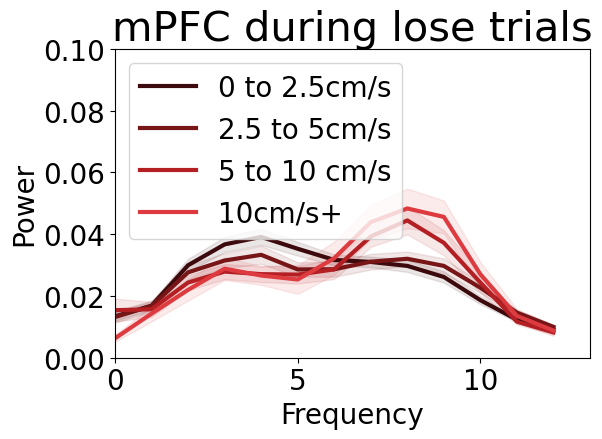

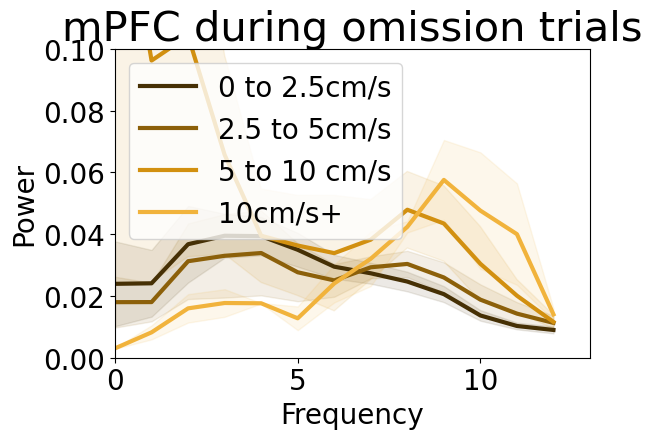

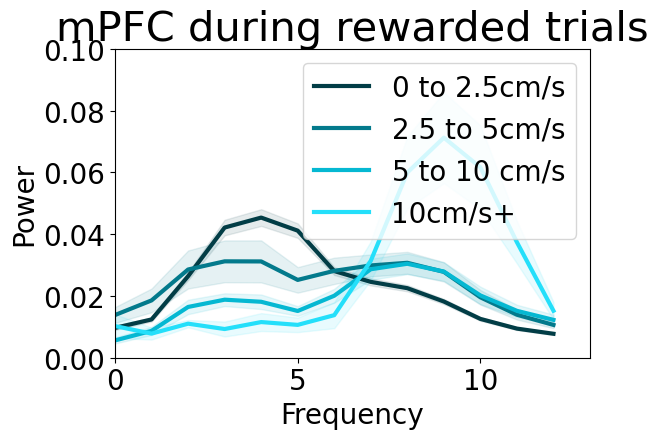

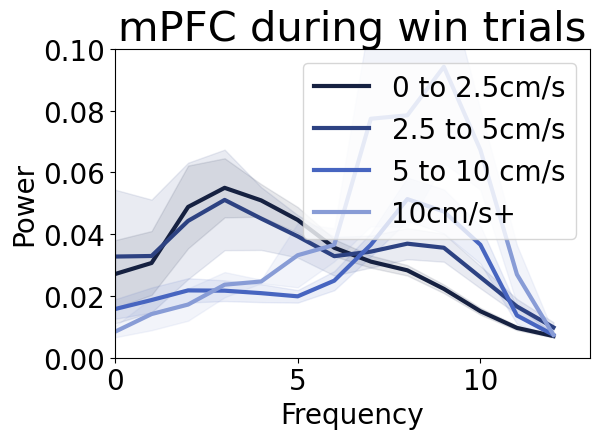

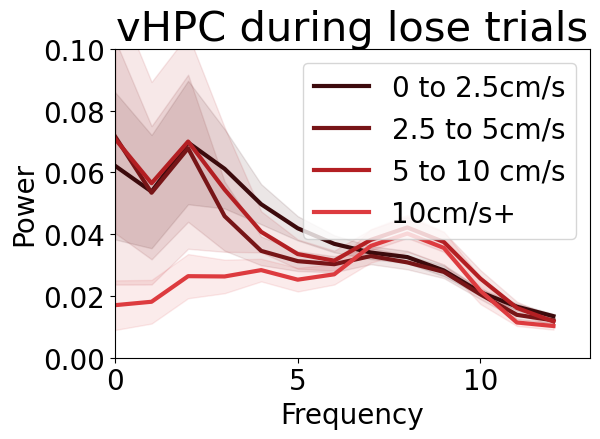

...

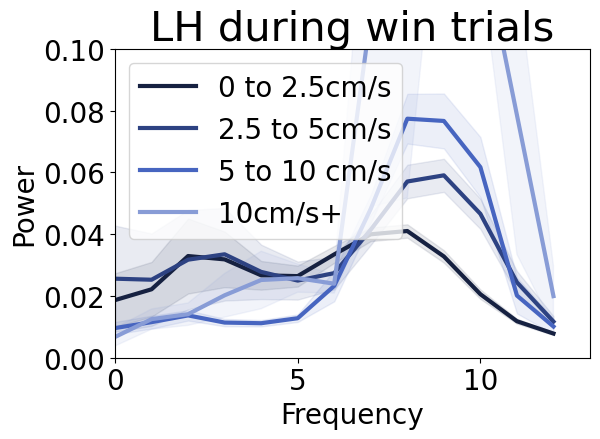

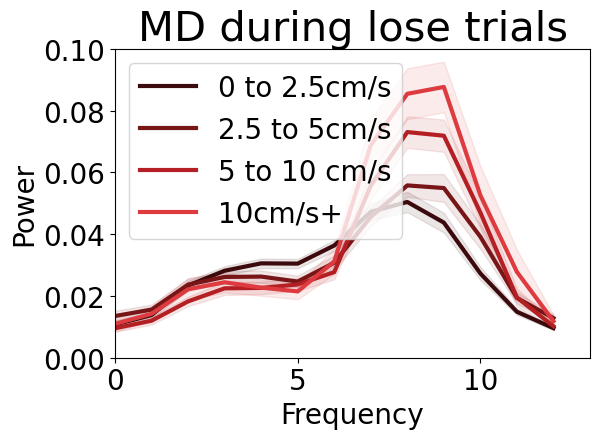

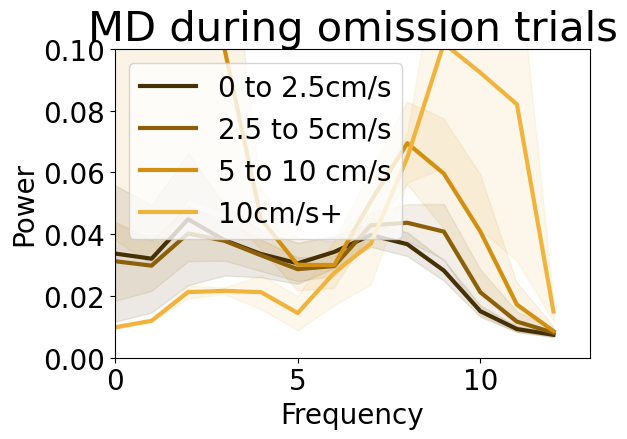

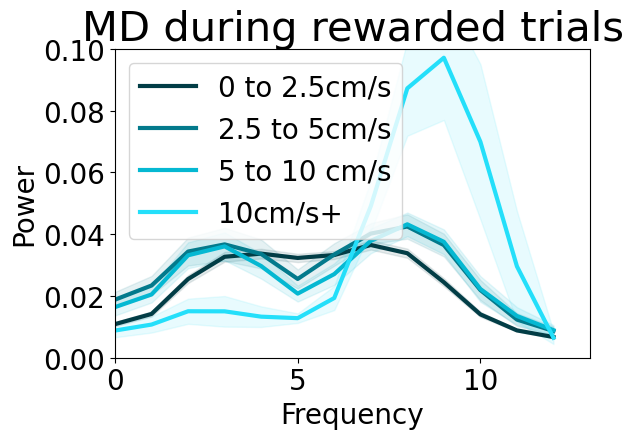

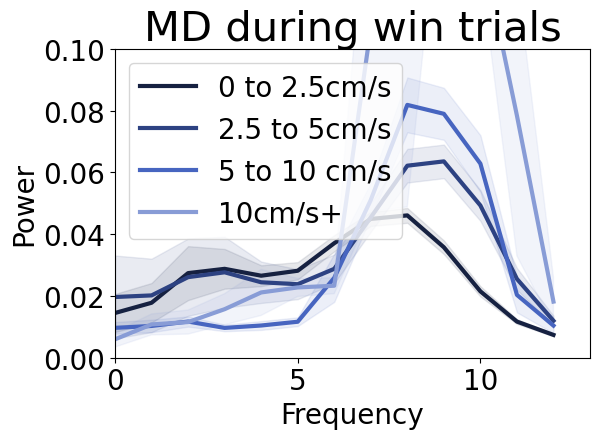

In [96]:
low_freq = 0
high_freq = 13
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("{} during {} trials".format(region.split("_")[0], outcome), fontsize=30)
        plt.xlabel("Frequency", fontsize=20)
        plt.ylabel("Power", fontsize=20)
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.1)
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
                
        plt.legend()
        plt.tight_layout()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

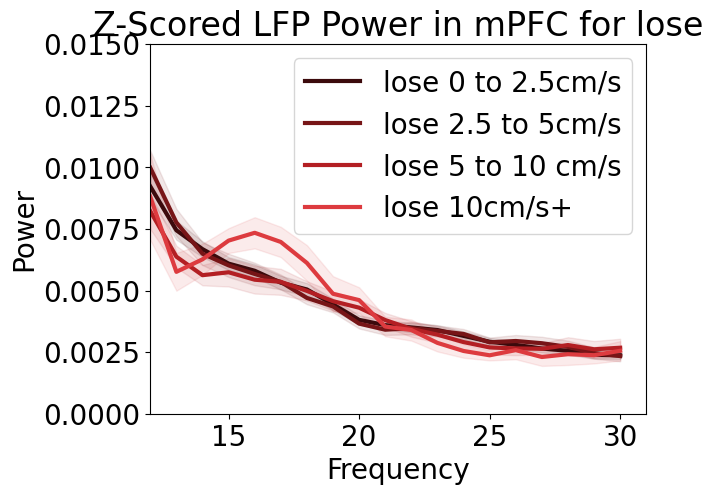

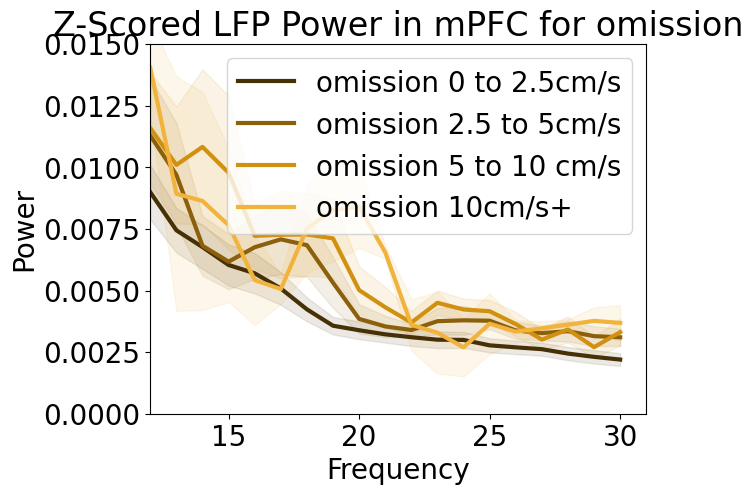

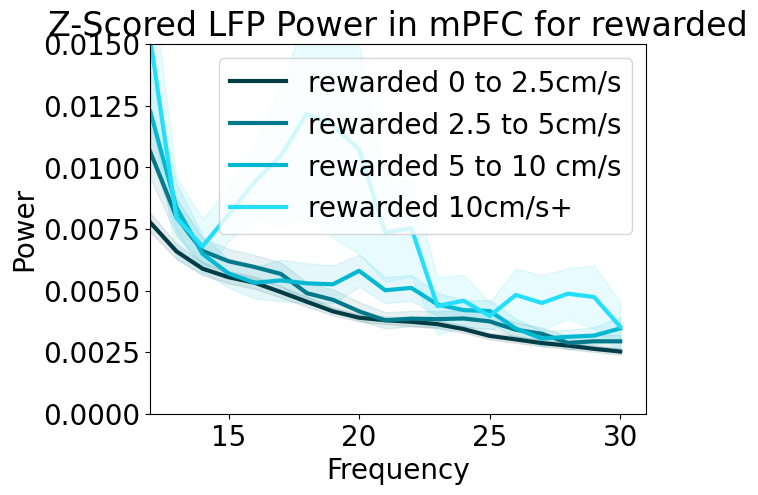

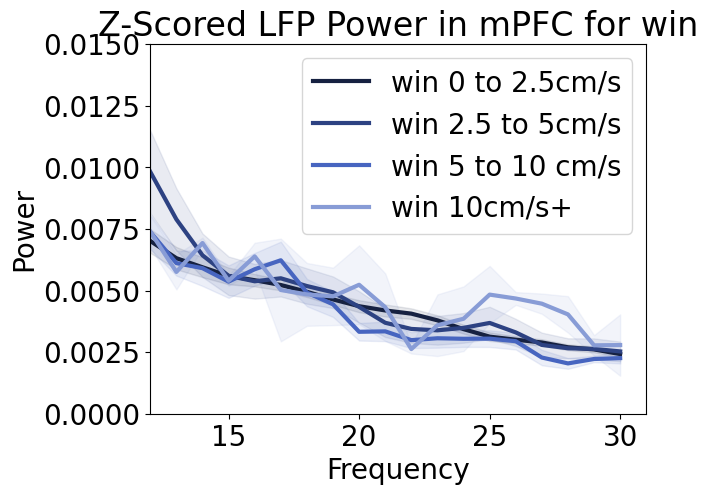

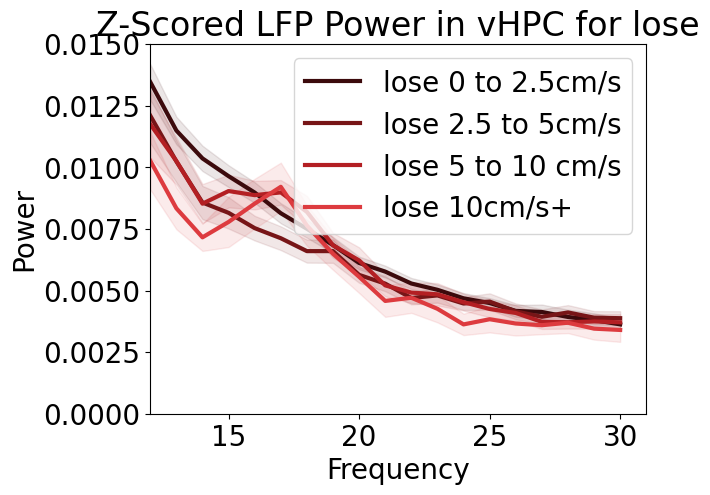

...

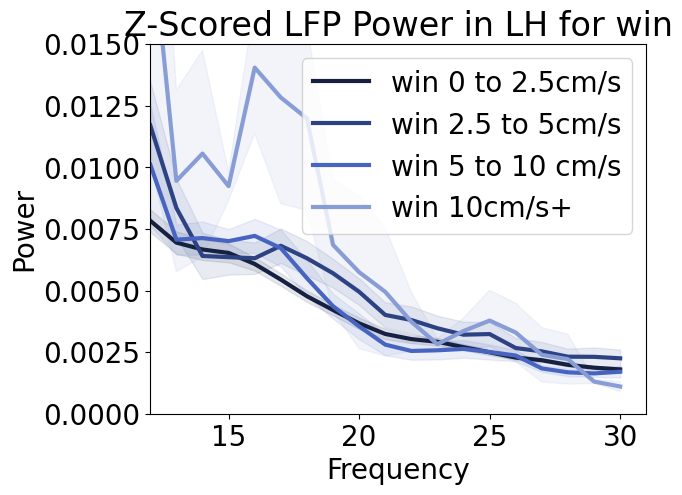

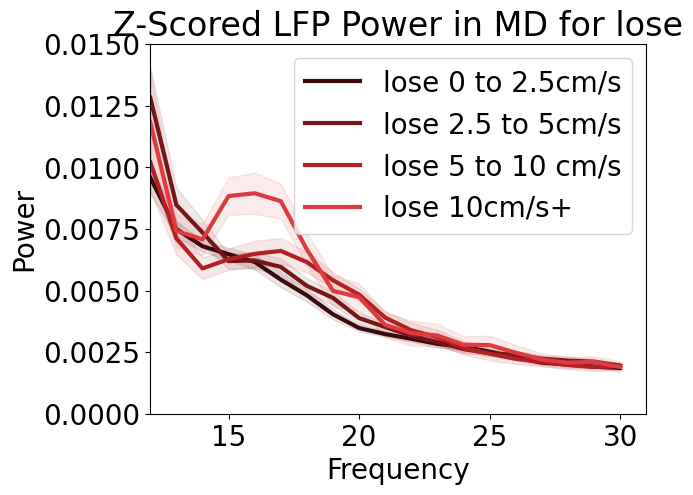

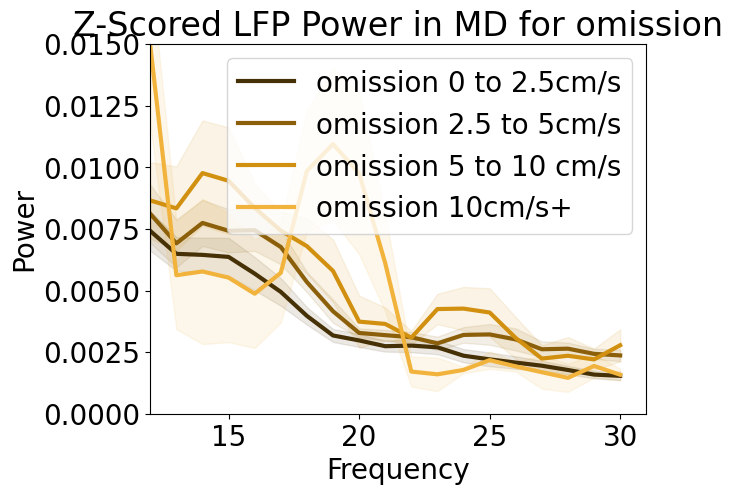

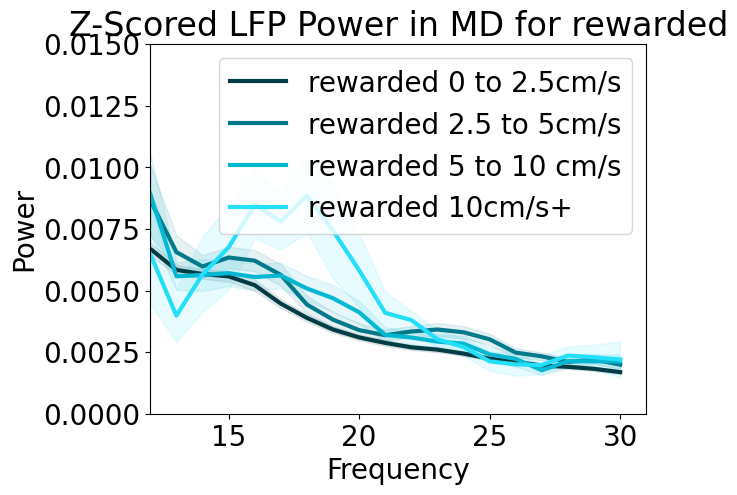

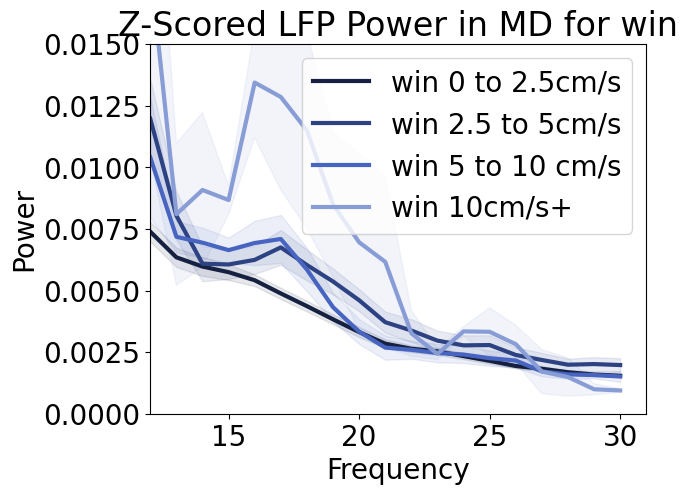

In [97]:
low_freq = 12
high_freq = 31
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("Z-Scored LFP Power in {} for {}".format(region.split("_")[0], outcome))
        plt.xlabel("Frequency")
        plt.ylabel("Power")
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.015)
        
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{} {}".format(outcome, BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
        plt.legend()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

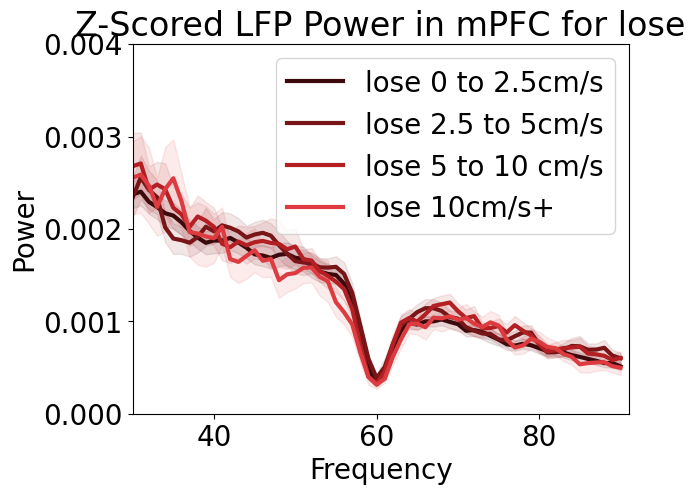

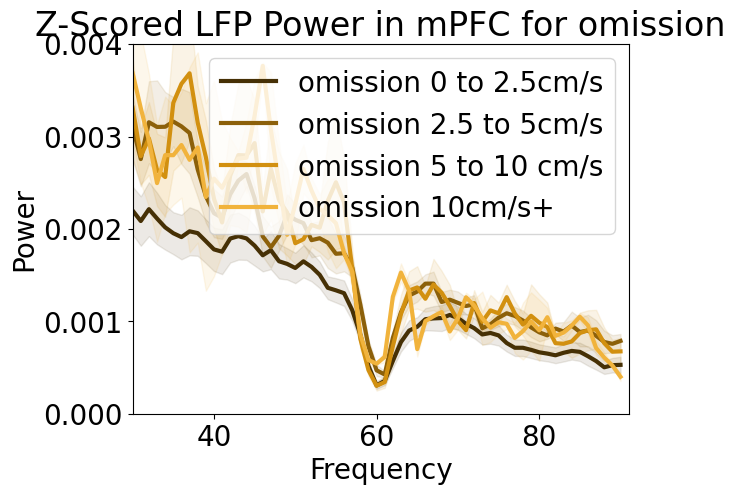

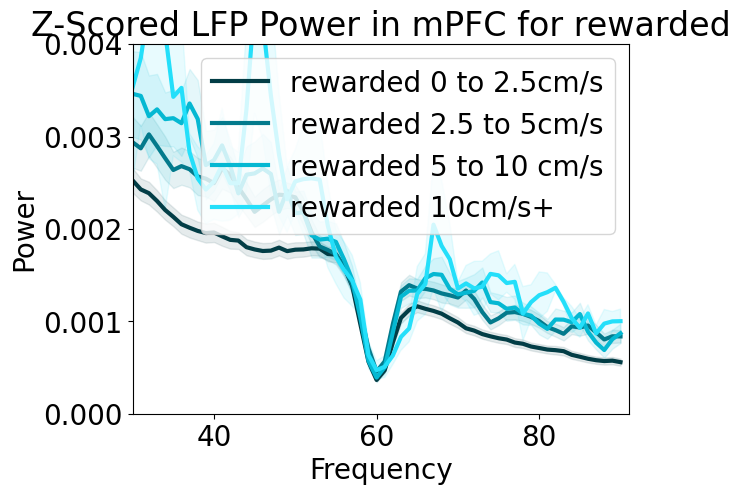

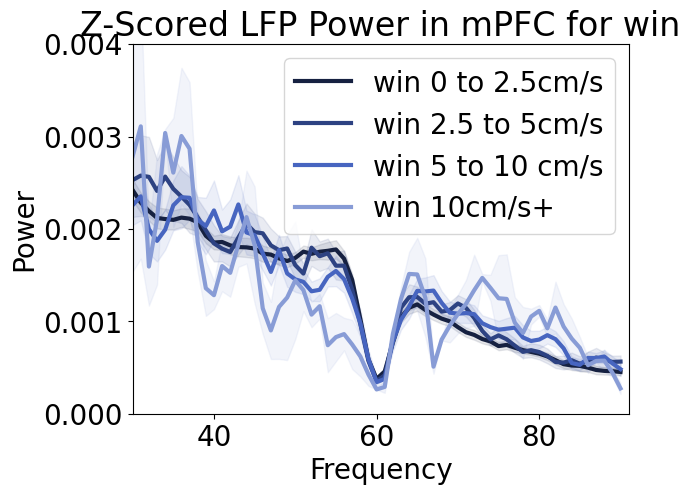

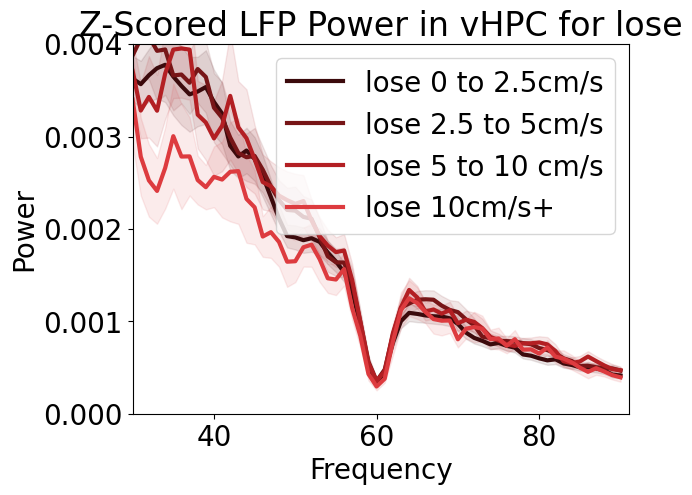

...

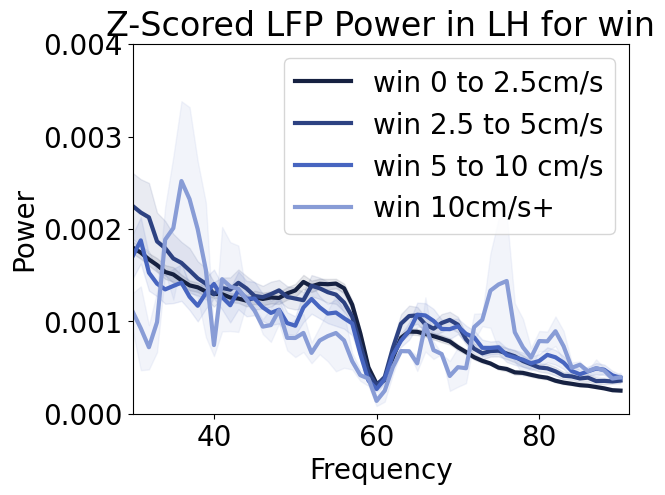

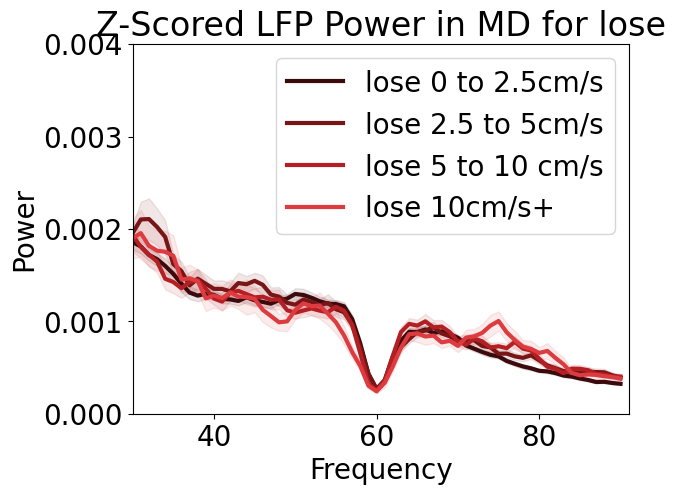

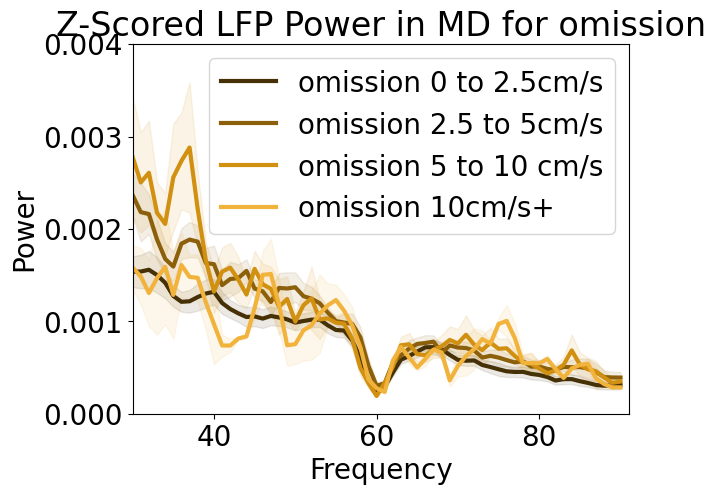

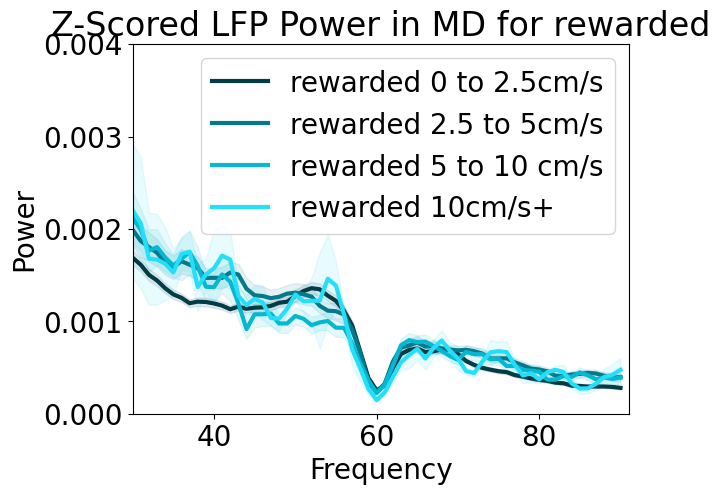

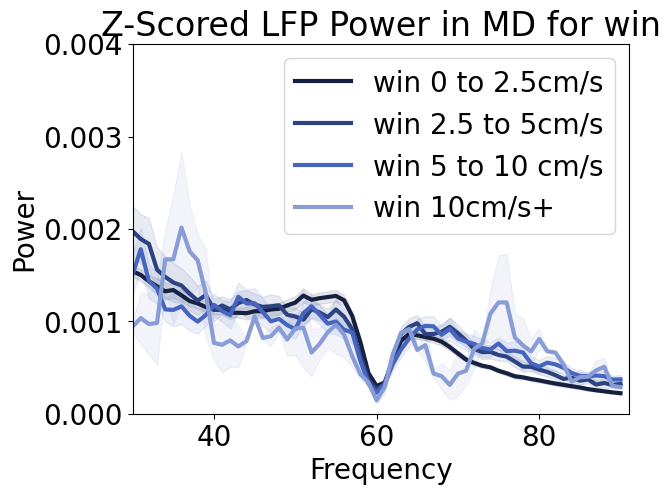

In [98]:
low_freq = 30
high_freq = 91
for region in grouped_all_trials_df["region_and_baseline_or_trial"].unique():
    region_df = grouped_all_trials_df[grouped_all_trials_df["region_and_baseline_or_trial"] == region]

    for outcome in region_df["trial_outcome"].unique():
        fig, ax = plt.subplots()
        plt.title("Z-Scored LFP Power in {} for {}".format(region.split("_")[0], outcome))
        plt.xlabel("Frequency")
        plt.ylabel("Power")
        plt.xlim(low_freq, high_freq) 
        # plt.yscale("log")
        plt.ylim(0, 0.004)
        outcome_df = region_df[(region_df["trial_outcome"] == outcome)]
        # Generate gradient colors
        gradient_colors = generate_gradient_colors(OUTCOME_TO_COLOR[outcome], 20)
        
        for index, row in outcome_df.iterrows():           
            current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
            mean_power = row["mean_power"][low_freq: high_freq]
            sem_power = row["sem_power"][low_freq: high_freq]
                
            
            try:
                ax = sns.lineplot(x=current_frequencies, y=mean_power, \
                label="{} {}".format(outcome, BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=3, color=gradient_colors[-(row["velocity_bin"]+1) *4])
                
                plt.fill_between(current_frequencies, 
                mean_power - sem_power, mean_power + sem_power, \
                alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            except Exception as e: 
                print(e)
                continue
        plt.legend()
        plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}_{}.png".format(low_freq, high_freq, region.split("_")[0], outcome))

# Plotting be velocity

In [99]:
grouped_all_trials_df = VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.groupby(['velocity_bin']).agg({k: lambda x: np.vstack([arr for arr in x.tolist() if not np.any(np.isnan(arr))]) for k in power_window_averaged_columns}).reset_index()

In [100]:
grouped_all_trials_df = pd.melt(grouped_all_trials_df, id_vars =['velocity_bin'], value_vars =grouped_all_trials_df.drop(columns=["velocity_bin"]).columns, value_name="power", var_name="region_and_baseline_or_trial") 

In [101]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power
0,0,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.012225265868504049, 0.01323417957797272, 0..."
1,1,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.0022962915383534796, 0.0019190475271426127..."
2,2,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.04567790859932387, 0.03153270299229599, 0...."
3,3,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.0050237937690065515, 0.005471537841194563,..."
4,0,vHPC_baseline_power_window-averaged-velocity-p...,"[[0.01282443985615306, 0.014166115529961592, 0..."


In [102]:
grouped_all_trials_df["brain_region"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [103]:
grouped_all_trials_df["trial_or_baseline"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [104]:
grouped_all_trials_df["mean_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanmean(np.vstack(x), axis=0))

In [105]:
grouped_all_trials_df["std_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanstd(np.vstack(x), axis=0))

In [106]:
grouped_all_trials_df["n_trials"] = grouped_all_trials_df["power"].apply(lambda x: np.sum(~np.isnan(x), axis=0))

In [107]:
grouped_all_trials_df["sem_power"] = grouped_all_trials_df.apply(lambda x: x["std_power"] / np.sqrt(x["n_trials"]), axis=1)

In [108]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,0,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.012225265868504049, 0.01323417957797272, 0...",mPFC,baseline,"[0.019031057784164262, 0.02284179600955606, 0....","[0.05735347315781186, 0.05502632270827901, 0.0...","[184, 184, 184, 184, 184, 184, 184, 184, 184, ...","[0.004228154137332583, 0.004056594330059647, 0..."
1,1,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.0022962915383534796, 0.0019190475271426127...",mPFC,baseline,"[0.030655230618783773, 0.03373359084264858, 0....","[0.16277177049547664, 0.1646686772657038, 0.17...","[126, 126, 126, 126, 126, 126, 126, 126, 126, ...","[0.014500861843635068, 0.014669851730036067, 0..."
2,2,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.04567790859932387, 0.03153270299229599, 0....",mPFC,baseline,"[0.0571189395740801, 0.05651339854881424, 0.06...","[0.38544876621224855, 0.3554493290386163, 0.34...","[82, 82, 82, 82, 82, 82, 82, 82, 82, 82, 82, 8...","[0.04256569547648535, 0.039252811848014664, 0...."
3,3,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.0050237937690065515, 0.005471537841194563,...",mPFC,baseline,"[0.01140135543867556, 0.014197455291684705, 0....","[0.015263823736317232, 0.012734803573687463, 0...","[31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 3...","[0.0027414636722447126, 0.0022872382421037893,..."
4,0,vHPC_baseline_power_window-averaged-velocity-p...,"[[0.01282443985615306, 0.014166115529961592, 0...",vHPC,baseline,"[0.03352525985541341, 0.03562587529679662, 0.0...","[0.1112247353388628, 0.10685687232391688, 0.12...","[184, 184, 184, 184, 184, 184, 184, 184, 184, ...","[0.008199596275586323, 0.007877593142016198, 0..."


# Drawing all velocity bins together for each trial outcome

In [109]:
OUTCOME_TO_COLOR

{'lose': '#951a1d',
 'omission': '#af780d',
 'rewarded': '#0499af',
 'win': '#3853a3'}

In [110]:
grouped_all_trials_df.head()

,velocity_bin,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,0,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.012225265868504049, 0.01323417957797272, 0...",mPFC,baseline,"[0.019031057784164262, 0.02284179600955606, 0....","[0.05735347315781186, 0.05502632270827901, 0.0...","[184, 184, 184, 184, 184, 184, 184, 184, 184, ...","[0.004228154137332583, 0.004056594330059647, 0..."
1,1,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.0022962915383534796, 0.0019190475271426127...",mPFC,baseline,"[0.030655230618783773, 0.03373359084264858, 0....","[0.16277177049547664, 0.1646686772657038, 0.17...","[126, 126, 126, 126, 126, 126, 126, 126, 126, ...","[0.014500861843635068, 0.014669851730036067, 0..."
2,2,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.04567790859932387, 0.03153270299229599, 0....",mPFC,baseline,"[0.0571189395740801, 0.05651339854881424, 0.06...","[0.38544876621224855, 0.3554493290386163, 0.34...","[82, 82, 82, 82, 82, 82, 82, 82, 82, 82, 82, 8...","[0.04256569547648535, 0.039252811848014664, 0...."
3,3,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.0050237937690065515, 0.005471537841194563,...",mPFC,baseline,"[0.01140135543867556, 0.014197455291684705, 0....","[0.015263823736317232, 0.012734803573687463, 0...","[31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 31, 3...","[0.0027414636722447126, 0.0022872382421037893,..."
4,0,vHPC_baseline_power_window-averaged-velocity-p...,"[[0.01282443985615306, 0.014166115529961592, 0...",vHPC,baseline,"[0.03352525985541341, 0.03562587529679662, 0.0...","[0.1112247353388628, 0.10685687232391688, 0.12...","[184, 184, 184, 184, 184, 184, 184, 184, 184, ...","[0.008199596275586323, 0.007877593142016198, 0..."


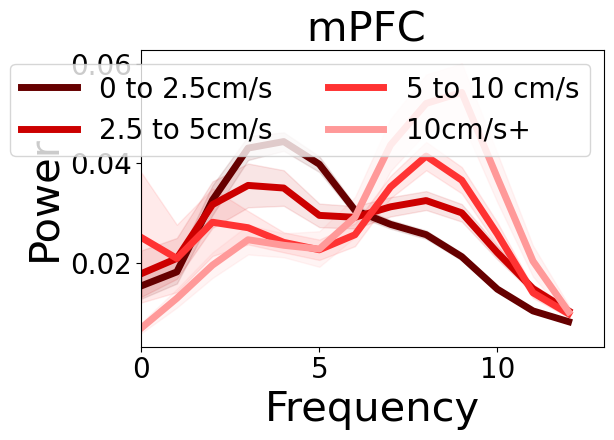

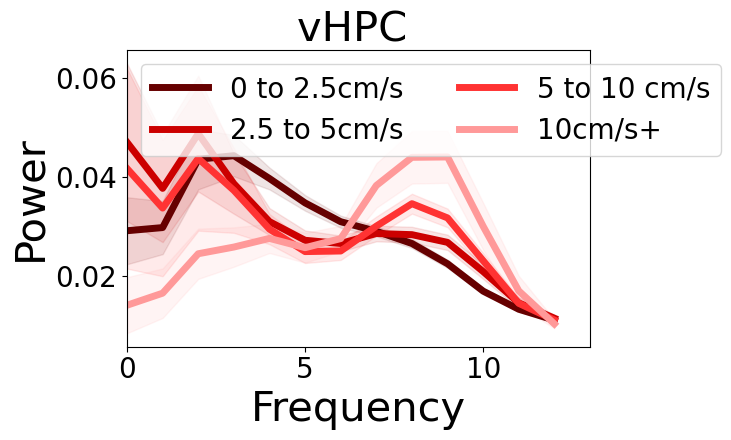

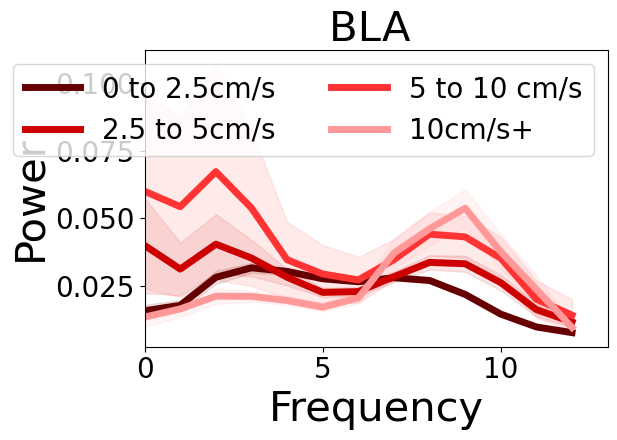

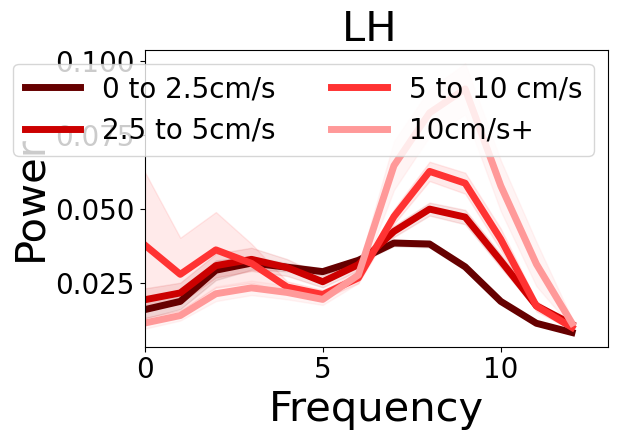

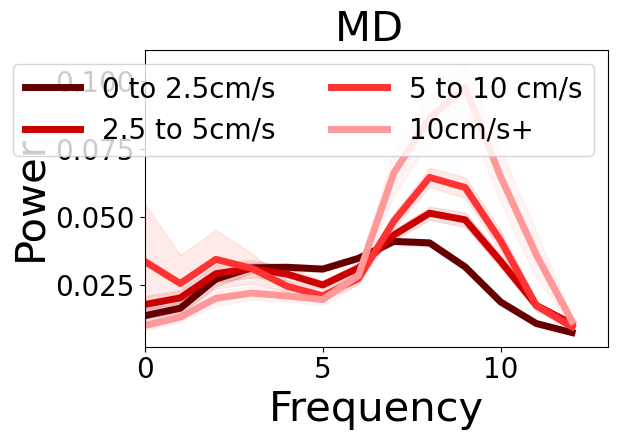

In [111]:
low_freq = 0
high_freq = 13
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("{} ".format(region.split("_")[0]), fontsize=30)
    plt.xlabel("Frequency", fontsize=30)
    plt.ylabel("Power", fontsize=30)
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.tight_layout()
    plt.legend(ncol=2)
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

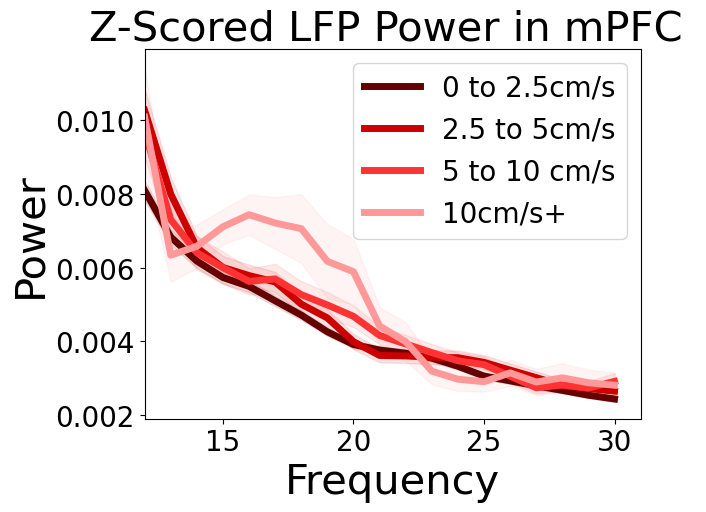

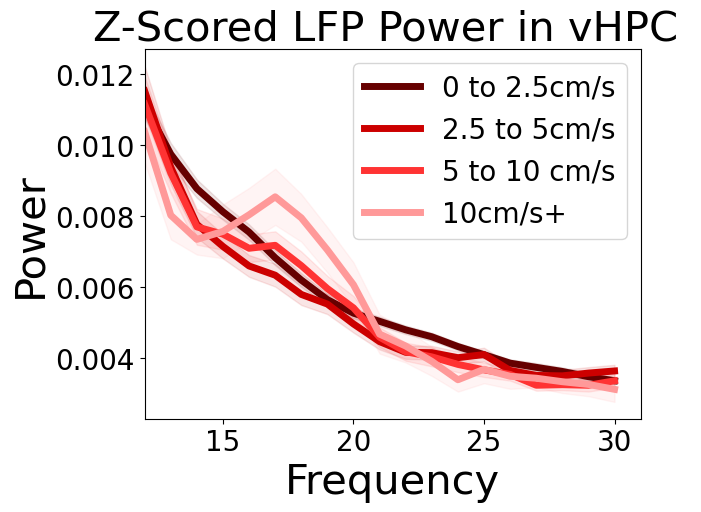

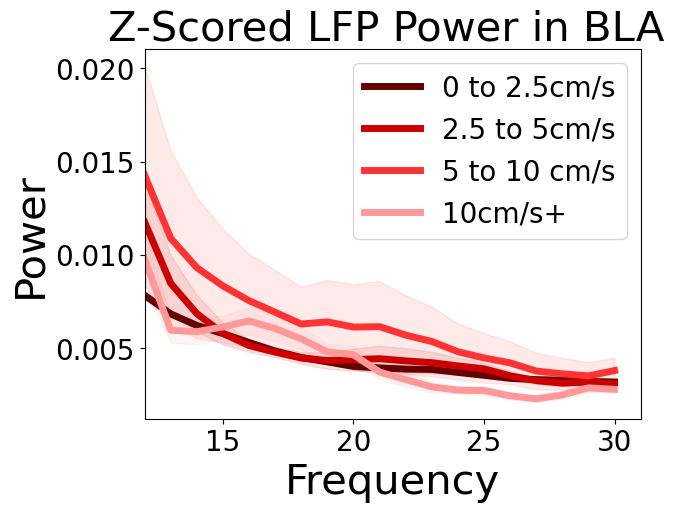

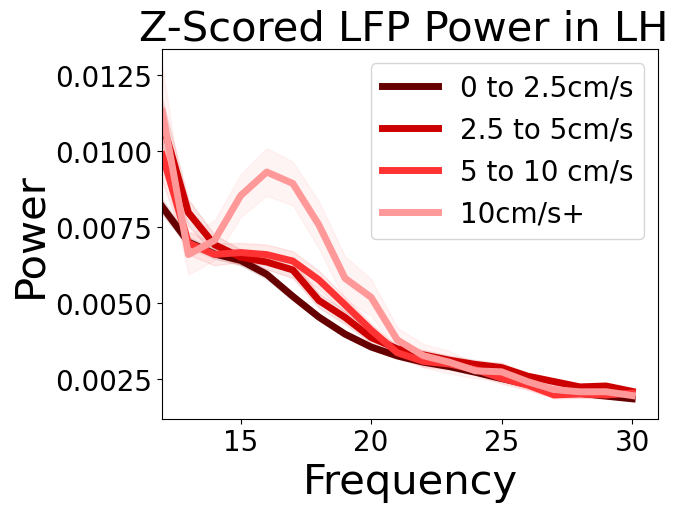

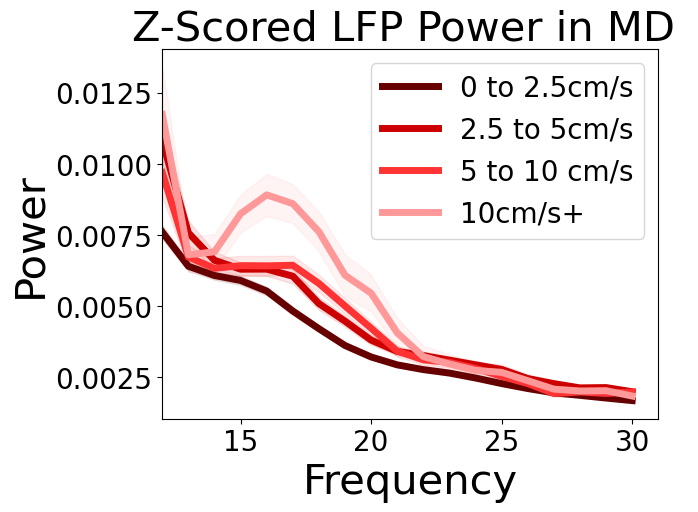

In [112]:
low_freq = 12
high_freq = 31
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("Z-Scored LFP Power in {} ".format(region.split("_")[0]), fontsize=30)
    plt.xlabel("Frequency", fontsize=30)
    plt.ylabel("Power", fontsize=30)
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.legend()
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

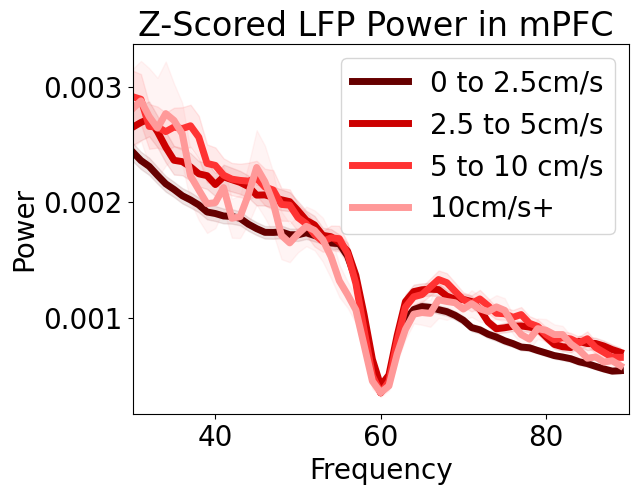

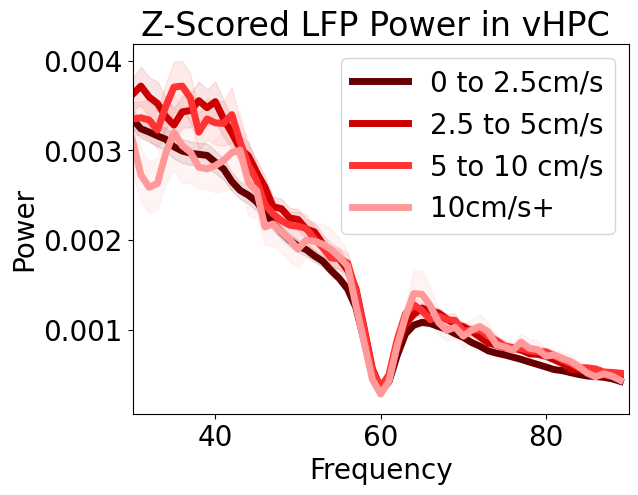

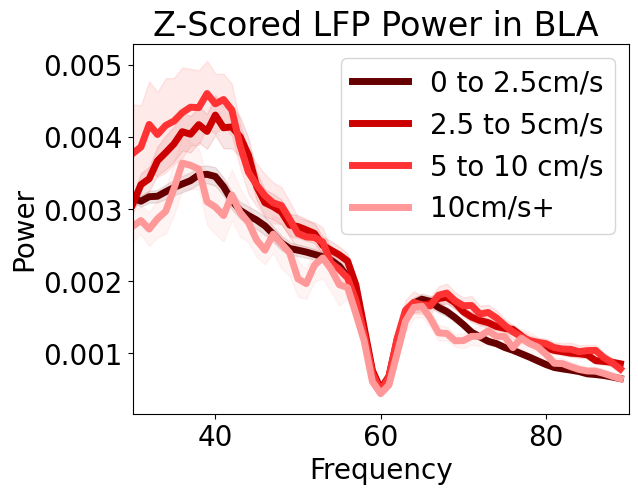

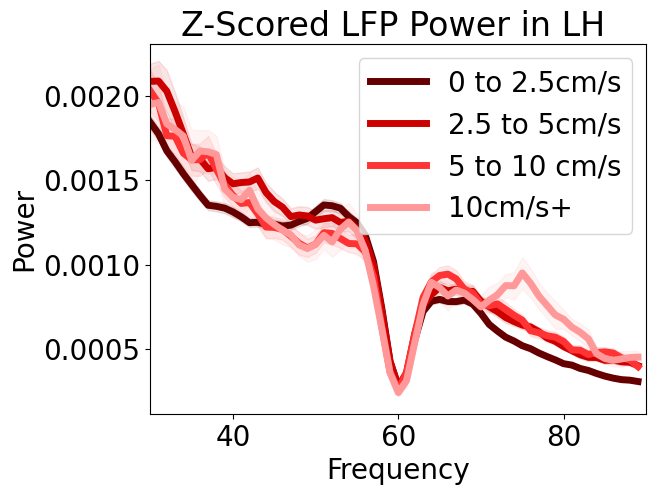

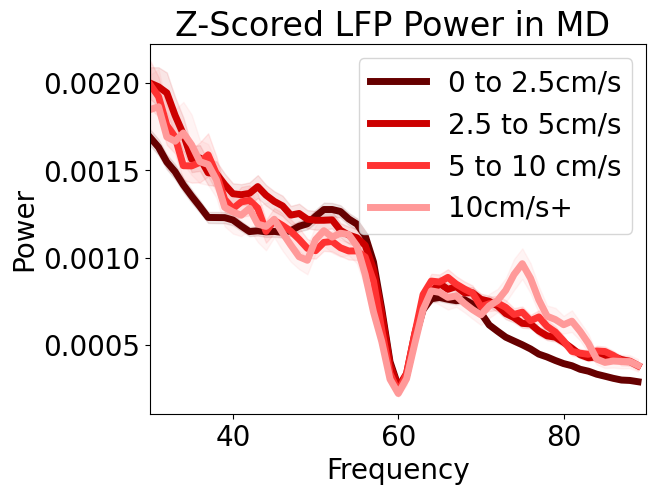

In [113]:
low_freq = 30
high_freq = 90
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("Z-Scored LFP Power in {} ".format(region.split("_")[0]))
    plt.xlabel("Frequency")
    plt.ylabel("Power")
    plt.xlim(low_freq, high_freq) 
    # plt.yscale("log")
    
    # Generate gradient colors
    gradient_colors = generate_gradient_colors("red", 20)
    
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(BIN_TO_VELOCITY[row["velocity_bin"]]), linewidth=5, color=gradient_colors[-(row["velocity_bin"]+1) *4])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=gradient_colors[-(row["velocity_bin"]+1) *4])
        
        except Exception as e: 
            print(e)
            continue
    plt.legend()
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))

# Parse power by lower velocity

In [115]:
MERGED_LFP_AND_SLEAP.head()

,time,recording_file,video_number,current_subject,mPFC_baseline_lfp_trace,mPFC_trial_lfp_trace,mPFC_baseline-trial_lfp_trace,vHPC_baseline_lfp_trace,vHPC_trial_lfp_trace,vHPC_baseline-trial_lfp_trace,...,vHPC_baseline-trial_power_window-averaged,BLA_baseline_power_window-averaged,BLA_trial_power_window-averaged,BLA_baseline-trial_power_window-averaged,LH_baseline_power_window-averaged,LH_trial_power_window-averaged,LH_baseline-trial_power_window-averaged,MD_baseline_power_window-averaged,MD_trial_power_window-averaged,MD_baseline-trial_power_window-averaged
0,4509412,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[-1.2365645, -1.3354121, -1.5621803, -1.494343...","[-1.0679421, -0.7713992, -0.69580984, -1.13190...","[-1.2365645, -1.3354121, -1.5621803, -1.494343...","[0.20910755, 0.39620376, 0.7075067, 1.040821, ...","[-2.4841347, -2.1523926, -1.564376, -1.139872,...","[0.20910755, 0.39620376, 0.7075067, 1.040821, ...",...,"[0.008191836368198214, 0.010847117137046183, 0...","[0.012599163379858275, 0.011360201086910032, 0...","[0.004972446872623769, 0.008729722033506105, 0...","[0.011388990089337346, 0.01170920203395701, 0....","[0.012690411090416112, 0.012184240671445733, 0...","[0.006481709673597404, 0.008569684531859578, 0...","[0.011845099574316457, 0.011737906328215883, 0...","[0.010418502621002771, 0.011026521672763969, 0...","[0.008092001892971601, 0.008591129034198217, 0...","[0.010360572719106316, 0.01052619601427247, 0...."
1,6909411,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[0.24421181, 0.2616555, 0.4380307, 0.4729181, ...","[-0.8605559, -0.6492933, -0.37407047, -0.05233...","[0.24421181, 0.2616555, 0.4380307, 0.4729181, ...","[0.5377051, 0.70907897, 0.5219827, 0.3506089, ...","[-0.31916416, -0.08647305, 0.19810188, 0.49525...","[0.5377051, 0.70907897, 0.5219827, 0.3506089, ...",...,"[0.015831437831015205, 0.0231624291939722, 0.0...","[0.007410722422837113, 0.008976797312911764, 0...","[0.008185041161626366, 0.0090356762064459, 0.0...","[0.0076411536257309145, 0.008882474221848614, ...","[0.006810114683712287, 0.008535397431890789, 0...","[0.007656965960026834, 0.009631215156596888, 0...","[0.008608442377727453, 0.009940529654106979, 0...","[0.006793831642399617, 0.008751032757266741, 0...","[0.006450411032342079, 0.009071964106769513, 0...","[0.007515946914709219, 0.009397190382653239, 0..."
2,9209413,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[1.7249881, 1.7424319, 1.6862243, 1.4323217, 0...","[-0.094971254, -0.16862243, -0.12404409, -0.22...","[1.7249881, 1.7424319, 1.6862243, 1.4323217, 0...","[0.7531016, 0.1776628, -0.37890917, -0.6980733...","[1.2908068, 1.0486822, 0.79712427, 0.55971646,...","[0.7531016, 0.1776628, -0.37890917, -0.6980733...",...,"[0.005597782623229536, 0.00938252998479095, 0....","[0.0036128230692141217, 0.006247605048339608, ...","[0.008522534910348507, 0.009053880205130843, 0...","[0.006193039668395896, 0.007714834697912776, 0...","[0.005183418751145097, 0.006856109821565806, 0...","[0.006406728344427634, 0.008301264535279579, 0...","[0.005992979376915459, 0.007629191053554874, 0...","[0.003682980143479501, 0.005960867037397471, 0...","[0.004673029010016894, 0.006021184058817625, 0...","[0.004513759399328175, 0.006175436909021622, 0..."
3,13109412,20230617_115521_standard_comp_to_omission_D1_s...,1.0,1.1,"[-0.89156693, -1.0485603, -0.7539555, -0.38182...","[2.3956015, 2.1804626, 1.9730763, 1.9750146, 2...","[-0.89156693, -1.0485603, -0.7539555, -0.38182...","[-0.72480136, -0.8631582, -0.610028, 0.1776628...","[2.0847864, 1.889829, 1.8442342, 1.9480019, 2....","[-0.72480136, -0.8631582, -0.610028, 0.1776628...",...,"[0.008534032230521202, 0.012045049410916144, 0...","[0.008846833403466993, 0.010726828487005385, 0...","[0.010492912213029665, 0.011272095725656909, 0...","[0.009683683469980163, 0.011247266883330097, 0...","[0.005164233423113439, 0.008187321508394718, 0...","[0.008939624858599733, 0.012440484405589265, 0...","[0.0070794494936013835, 0.

In [120]:

MERGED_LFP_AND_SLEAP["trial_velocity_binned-mask"] = MERGED_LFP_AND_SLEAP["trial_subject_thorax_velocity_chunked"].apply(lambda x: [index for index, num in enumerate(x) if MIN_VELOCITY <= num <= MAX_VELOCITY])

MERGED_LFP_AND_SLEAP["baseline_velocity_binned-mask"] = MERGED_LFP_AND_SLEAP["baseline_subject_thorax_velocity_chunked"].apply(lambda x: [index for index, num in enumerate(x) if MIN_VELOCITY <= num <= MAX_VELOCITY])

for col in baseline_power_all_window_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_power_window-averaged-velocity-parsed".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["baseline_velocity_binned-mask"]]), axis=0), axis=1)

for col in trial_power_window_averaged_columns:
    region_and_baseline_or_trial = "_".join(col.split("_")[:2])
    MERGED_LFP_AND_SLEAP["{}_power_window-averaged-velocity-parsed".format(region_and_baseline_or_trial)] = MERGED_LFP_AND_SLEAP.apply(lambda x: np.nanmean(np.array([x[col][i] for i in x["trial_velocity_binned-mask"]]), axis=0), axis=1)



In [121]:
for col in MERGED_LFP_AND_SLEAP.columns:
    print(col)

time
recording_file
video_number
current_subject
mPFC_baseline_lfp_trace
mPFC_trial_lfp_trace
mPFC_baseline-trial_lfp_trace
vHPC_baseline_lfp_trace
vHPC_trial_lfp_trace
vHPC_baseline-trial_lfp_trace
BLA_baseline_lfp_trace
BLA_trial_lfp_trace
BLA_baseline-trial_lfp_trace
LH_baseline_lfp_trace
LH_trial_lfp_trace
LH_baseline-trial_lfp_trace
MD_baseline_lfp_trace
MD_trial_lfp_trace
MD_baseline-trial_lfp_trace
recording_dir
time_stamp_index
video_file
video_frame
subject_info
competition_closeness
video_name
all_subjects
trial_outcome
lfp_index
baseline_lfp_timestamp_range
trial_lfp_timestamp_range
baseline_ephys_timestamp_range
trial_ephys_timestamp_range
baseline_videoframe_range
trial_videoframe_range
trial_number
Cohort
spike_interface_mPFC
spike_interface_vHPC
spike_interface_BLA
spike_interface_LH
spike_interface_MD
file_path
start_frame
stop_frame
individual_subj
all_subj
recording_name
track_names
subject_and_tracks_list
subject_id
agent_id
corner_path
corner_parts
bottom_width
top_

In [122]:
VELOCITY_PARSED_MERGED_LFP_AND_SLEAP["trial_outcome"]

0          lose
1           win
2           win
3           win
4           win
         ...   
731    rewarded
732    rewarded
733    rewarded
734    omission
735    rewarded
Name: trial_outcome, Length: 736, dtype: object

In [123]:
grouped_all_trials_df = VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.groupby(['trial_outcome']).agg({k: lambda x: np.vstack([arr for arr in x.tolist() if not np.any(np.isnan(arr))]) for k in power_window_averaged_columns}).reset_index()

In [124]:
grouped_all_trials_df = pd.melt(grouped_all_trials_df, id_vars =['trial_outcome'], value_vars =grouped_all_trials_df.drop(columns=["trial_outcome"]).columns, value_name="power", var_name="region_and_baseline_or_trial") 

In [125]:
grouped_all_trials_df.head()

,trial_outcome,region_and_baseline_or_trial,power
0,lose,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.012225265868504049, 0.01323417957797272, 0..."
1,omission,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.01623660602102775, 0.015745623179016326, 0..."
2,rewarded,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.01162858865306466, 0.013758110808847309, 0..."
3,win,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.010115786139971505, 0.015924941573226097, ..."
4,lose,vHPC_baseline_power_window-averaged-velocity-p...,"[[0.01282443985615306, 0.014166115529961592, 0..."


In [126]:
grouped_all_trials_df["brain_region"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[0].strip())

In [127]:
grouped_all_trials_df["trial_or_baseline"] = grouped_all_trials_df["region_and_baseline_or_trial"].apply(lambda x: x.split("_")[1].strip())

In [128]:
grouped_all_trials_df["mean_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanmean(np.vstack(x), axis=0))

In [129]:
grouped_all_trials_df["std_power"] = grouped_all_trials_df["power"].apply(lambda x: np.nanstd(np.vstack(x), axis=0))

In [130]:
grouped_all_trials_df["n_trials"] = grouped_all_trials_df["power"].apply(lambda x: np.sum(~np.isnan(x), axis=0))

In [131]:
grouped_all_trials_df["sem_power"] = grouped_all_trials_df.apply(lambda x: x["std_power"] / np.sqrt(x["n_trials"]), axis=1)

In [132]:
grouped_all_trials_df

,trial_outcome,region_and_baseline_or_trial,power,brain_region,trial_or_baseline,mean_power,std_power,n_trials,sem_power
0,lose,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.012225265868504049, 0.01323417957797272, 0...",mPFC,baseline,"[0.016742960333324147, 0.022837639153004394, 0...","[0.034989490473514226, 0.0474666850247739, 0.0...","[127, 127, 127, 127, 127, 127, 127, 127, 127, ...","[0.003104815213282595, 0.004211987193713749, 0..."
1,omission,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.01623660602102775, 0.015745623179016326, 0...",mPFC,baseline,"[0.008966293615501874, 0.011837989238975508, 0...","[0.006599179409008031, 0.007534816392761577, 0...","[33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3...","[0.0011487696827512254, 0.0013116431757085021,..."
2,rewarded,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.01162858865306466, 0.013758110808847309, 0...",mPFC,baseline,"[0.04976250718318198, 0.05024136557655703, 0.0...","[0.3000071885624337, 0.2813709375452072, 0.280...","[177, 177, 177, 177, 177, 177, 177, 177, 177, ...","[0.0225499211655249, 0.021149134760128703, 0.0..."
3,win,mPFC_baseline_power_window-averaged-velocity-p...,"[[0.010115786139971505, 0.015924941573226097, ...",mPFC,baseline,"[0.013619317800692525, 0.015625432355914997, 0...","[0.010793130323649005, 0.008903777459921965, 0...","[86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 8...","[0.001163853174345197, 0.0009601190154896523, ..."
4,lose,vHPC_baseline_power_window-averaged-velocity-p...,"[[0.01282443985615306, 0.014166115529961592, 0...",vHPC,baseline,"[0.06639628563840563, 0.07007590989123597, 0.0...","[0.18261731003806383, 0.1989364745232015, 0.20...","[127, 127, 127, 127, 127, 127, 127, 127, 127, ...","[0.016204665879433658, 0.017652757562845574, 0..."
5,omission,vHPC_baseline_power_window-averaged-velocity-p...,"[[0.014374468913110538, 0.01589043159181804, 0...",vHPC,baseline,"[0.008988327218610695, 0.013445537402383398, 0...","[0.005663874723260389, 0.007645602012907785, 0...","[33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3...","[0.0009859540354518954, 0.0013309284767771521,..."
6,rewarded,vHPC_baseline_power_window-averaged-velocity-p...,"[[0.014064768849050866, 0.0184208689977468, 0....",vHPC,baseline,"[0.01640380138939998, 0.019660316575391766, 0....","[0.02799539817313216, 0.02798574150739194, 0.0...","[177, 177, 177, 177, 177, 177, 177, 177, 177, ...","[0.002104262983919244, 0.0021035371444745052, ..."
7,win,vHPC_baseline_power_window-averaged-velocity-p...,"[[0.01694408021956974, 0.02647932092992547, 0....",vHPC,baseline,"[0.05599797621395068, 0.04530941818534321, 0.0...","[0.25713468886065943, 0.16179799282502008, 0.2...","[86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 86, 8...","[0.02772754658664819, 0.017447126265071947, 0...."
8,lose,BLA_baseline_power_window-averaged-velocity-pa...,"[[0.006657589819535038, 0.007763539253542094, ...",BLA,baseline,"[0.02873636464326083, 0.03183899233441444, 0.0...","[0.0633809566712766, 0.06380543784387935, 0.07...","[127, 127, 127, 127, 127, 127, 127, 127, 127, ...","[0.005624150447527797, 0.005661817060691159, 0..."
9,omission,BLA_baseline_power_window-averaged-velocity-pa...,"[[0.007497753788290262, 0.008570429506626578, ...",BLA,baseline,"[0.008424056667108862, 0.011426367790962741, 0...","[0.0045212640790752035, 0.005506776428252028, ...","[33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 3...","[0.0007870510528421083, 0.0009586067325022032,..."


In [133]:
OUTCOME_TO_COLOR

{'lose': '#951a1d',
 'omission': '#af780d',
 'rewarded': '#0499af',
 'win': '#3853a3'}

In [134]:
FONTSIZE=20

In [135]:
font = {'weight' : 'medium',
        'size'   : 15}

matplotlib.rc('font', **font)

In [136]:
BAND_TO_FREQ

{'theta': (6, 11), 'beta': (20, 31), 'gamma': (30, 51)}

In [137]:
BAND_TO_FREQ_PLOT = {'theta': (6, 10), 'beta': (20, 30), 'gamma': (30, 50)}
BAND_TO_FREQ_COLOR = {'theta': "red", 'beta': "blue", 'gamma': "green"}

BAND_TO_FREQ_PLOT = {'theta': (6, 10), 'gamma': (30, 50)}
BAND_TO_FREQ_COLOR = {'theta': "red", 'gamma': "green"}

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


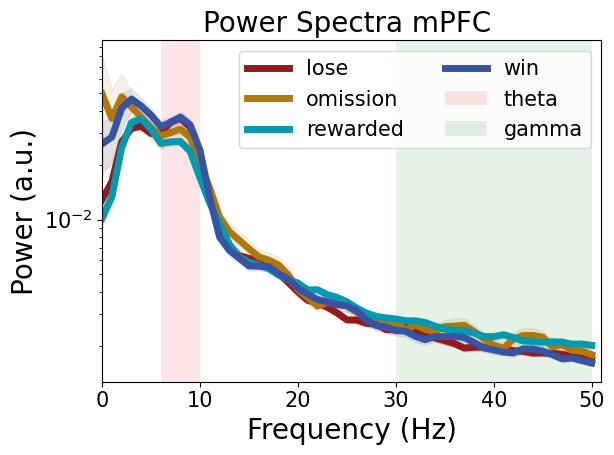

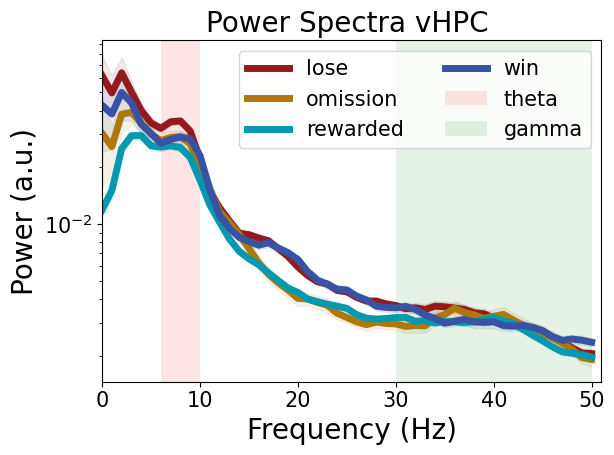

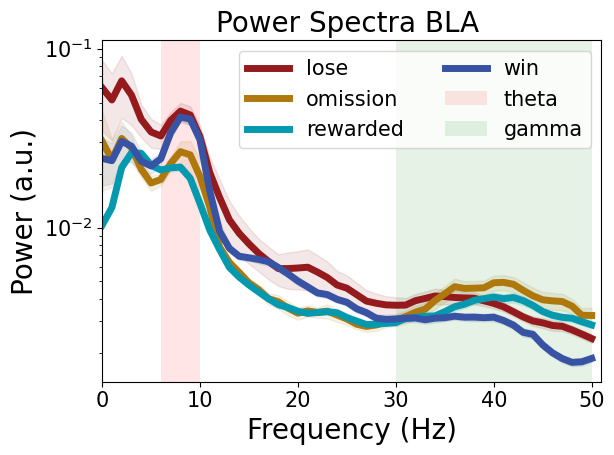

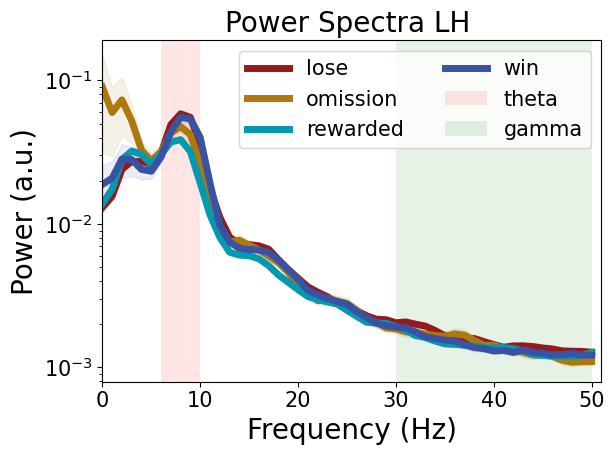

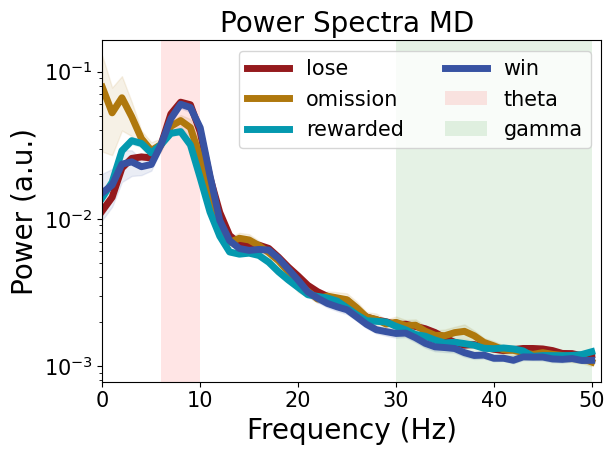

In [138]:
low_freq = 0
high_freq = 51
for region in grouped_all_trials_df["brain_region"].unique():
    region_df = grouped_all_trials_df[(grouped_all_trials_df["brain_region"] == region) & (grouped_all_trials_df["trial_or_baseline"] == "trial")]

    fig, ax = plt.subplots()
    plt.title("Power Spectra {} ".format(region.split("_")[0]), fontsize=FONTSIZE)
    plt.xlabel("Frequency (Hz)", fontsize=FONTSIZE)
    plt.ylabel("Power (a.u.)", fontsize=FONTSIZE)
    plt.xlim(low_freq, high_freq) 
    plt.yscale("log")
        
    for index, row in region_df.iterrows():           

        current_frequencies = ALL_FREQUENCIES[low_freq: high_freq]
        mean_power = row["mean_power"][low_freq: high_freq]
        sem_power = row["sem_power"][low_freq: high_freq]
            
        
        try:
            ax = sns.lineplot(x=current_frequencies, y=mean_power, \
            label="{}".format(row["trial_outcome"]), linewidth=5, color=OUTCOME_TO_COLOR[row["trial_outcome"]])
            
            plt.fill_between(current_frequencies, 
            mean_power - sem_power, mean_power + sem_power, \
            alpha=0.1, color=OUTCOME_TO_COLOR[row["trial_outcome"]])
        
        except Exception as e: 
            print(e)
            continue
    for band, (min_freq, max_freq) in BAND_TO_FREQ_PLOT.items():
        ax.axvspan(min_freq, max_freq, facecolor=BAND_TO_FREQ_COLOR[band], alpha=0.1, label=band)
    plt.legend(fontsize=15, ncol=2)


    plt.tight_layout()
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.png".format(low_freq, high_freq, region.split("_")[0]))
    plt.savefig("./proc/velocity_parsed_power/rce_velocity_parsed_lfp_power_freq_{}_to_{}_region_{}.eps".format(low_freq, high_freq, region.split("_")[0]))

# Exporting Velocity Parsed dataframe for plotting

In [140]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "lfp_trace" in col], errors="ignore")

In [143]:
MERGED_LFP_AND_SLEAP["mPFC_trial_power_window-averaged-velocity-parsed"].iloc[0].shape

(500,)

In [141]:
for col in MERGED_LFP_AND_SLEAP:
    print(col)

time
recording_file
video_number
current_subject
recording_dir
time_stamp_index
video_file
video_frame
subject_info
competition_closeness
video_name
all_subjects
trial_outcome
lfp_index
baseline_lfp_timestamp_range
trial_lfp_timestamp_range
baseline_ephys_timestamp_range
trial_ephys_timestamp_range
baseline_videoframe_range
trial_videoframe_range
trial_number
Cohort
spike_interface_mPFC
spike_interface_vHPC
spike_interface_BLA
spike_interface_LH
spike_interface_MD
file_path
start_frame
stop_frame
individual_subj
all_subj
recording_name
track_names
subject_and_tracks_list
subject_id
agent_id
corner_path
corner_parts
bottom_width
top_width
right_height
left_height
average_height
average_width
width_ratio
height_ratio
box_bottom_left
reward_port
box_top_left
box_top_right
box_bottom_right
chunked_trial_ephys_timestamp
chunked_baseline_ephys_timestamp
chunked_trial_lfp_index
chunked_baseline_lfp_index
baseline_subject_thorax_velocity_chunked
baseline_agent_thorax_velocity_chunked
trial_sub

In [144]:
MERGED_LFP_AND_SLEAP.to_pickle("./proc/rce_sleap_and_power.pkl")

In [146]:
MERGED_LFP_AND_SLEAP["recording_file"].unique()

array(['20230617_115521_standard_comp_to_omission_D1_subj_1-1_t1b3L_box1_merged',
       '20230617_115521_standard_comp_to_omission_D1_subj_1-2_t2b2L_box2_merged',
       '20230618_100636_standard_comp_to_omission_D2_subj_1_1_t1b2L_box2_merged',
       '20230618_100636_standard_comp_to_omission_D2_subj_1_4_t4b3L_box1_merged',
       '20230619_115321_standard_comp_to_omission_D3_subj_1-4_t3b3L_box2_merged',
       '20230620_114347_standard_comp_to_omission_D4_subj_1-1_t1b2L_box_2_merged',
       '20230620_114347_standard_comp_to_omission_D4_subj_1-2_t3b3L_box_1_merged',
       '20230621_111240_standard_comp_to_omission_D5_subj_1-4_t3b3L_box1_merged'],
      dtype=object)

In [ ]:
raise ValueError()

In [ ]:
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP = VELOCITY_PARSED_MERGED_LFP_AND_SLEAP[VELOCITY_PARSED_MERGED_LFP_AND_SLEAP["velocity_bin"] == 0].copy()

In [ ]:
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP = EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.drop(columns=[col for col in EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "baseline" in col], errors="ignore")

In [ ]:
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP = EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.drop(columns=[col for col in EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "trace" in col], errors="ignore")

In [ ]:
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP = pd.melt(EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP, id_vars=EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.columns[:19], value_vars=[col for col in EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.columns if "power_window-averaged-velocity-parsed" in col], value_name="power", var_name="region_and_baseline_or_trial")




In [ ]:
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP["brain_region"] = EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP["region_and_baseline_or_trial"].apply(lambda x:x.split("_")[0])
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP["trial_or_baseline"] = EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP["region_and_baseline_or_trial"].apply(lambda x:x.split("_")[1])

In [ ]:
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP = EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.dropna(subset=["power"])

In [ ]:
for band, (min_freq, max_freq) in BAND_TO_FREQ.items():
    EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP["mean_{}_power".format(band)] = EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP["power"].apply(lambda x: np.nanmean(x[min_freq:max_freq]))

In [ ]:
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.to_pickle("./proc/rce_velocity_parsed_power_spectra_region_and_baselinetrial_rows.pkl")

In [ ]:
EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP

In [ ]:
for col in EXPORTED_VELOCITY_PARSED_MERGED_LFP_AND_SLEAP.columns[:19]:
    print(col)

# Calculating the velocity parsed average power for each frequency band

In [ ]:
BAND_TO_FREQ

In [ ]:
velocity_parsed_power_window_averaged_columns = [col for col in MERGED_LFP_AND_SLEAP.columns if "power_window-averaged-velocity-parsed" in col]

In [ ]:
velocity_parsed_power_window_averaged_columns

- Removing all trials that have a high velocity trhoguhout

In [ ]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_velocity_binned-mask"].map(len) >= 1]

In [ ]:
for col in velocity_parsed_power_window_averaged_columns:
    region_base_name = "_".join(col.split("_")[:2])
    print(region_base_name)
    for band, (min_freq, max_freq) in BAND_TO_FREQ.items():
        print(band)
        MERGED_LFP_AND_SLEAP["{}_{}_all_power".format(region_base_name, band)] = MERGED_LFP_AND_SLEAP[col].apply(lambda x: x[min_freq:max_freq])
        MERGED_LFP_AND_SLEAP["{}_{}_mean_power".format(region_base_name, band)] = MERGED_LFP_AND_SLEAP["{}_{}_all_power".format(region_base_name, band)].apply(lambda x: x.mean())

In [ ]:
# MD_trial_mean_gamma_power
mean_power_col = [col for col in MERGED_LFP_AND_SLEAP.columns if "mean_power" in col]

In [ ]:
mean_power_df = pd.DataFrame(MERGED_LFP_AND_SLEAP.groupby(['trial_outcome'])[mean_power_col].mean()).reset_index()

In [ ]:
mean_power_df["color"] = mean_power_df["trial_outcome"].map(OUTCOME_TO_COLOR)

In [ ]:
sem_power_df = pd.DataFrame(MERGED_LFP_AND_SLEAP.groupby(['trial_outcome'])[mean_power_col].sem()).reset_index()

In [ ]:
mean_power_df

In [ ]:
OUTCOME_COMPARISONS

In [ ]:
rank_sum_dict = []
for col in mean_power_col:
    region = col.split("_")[0]
    baseline_or_trial = col.split("_")[1]
    band = col.split("_")[2]
    if baseline_or_trial != "trial":
        continue
    for key, (first_outcome, second_outcome) in  OUTCOME_COMPARISONS.items():
        first_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == first_outcome]
        second_df = MERGED_LFP_AND_SLEAP[MERGED_LFP_AND_SLEAP["trial_outcome"] == second_outcome]
        statistic, p_value = mannwhitneyu(first_df[col], second_df[col], alternative='two-sided')
        rank_sum_dict.append({"region": region, "band": band, "comparison": key, "mannwhitneyu_statistic": statistic, "mannwhitneyu_pvalue": p_value, "all_outcomes": set([first_outcome, second_outcome])})
rank_sum_df = pd.DataFrame(rank_sum_dict)

In [ ]:
rank_sum_df.head()

In [ ]:
current_df

In [ ]:
round(mean_power_df[[col for col in mean_power_df.columns if "theta" in col]].to_numpy().max() * 1.25, 3)

In [ ]:
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.copy()
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "multitaper" in col], errors="ignore").copy()
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "connectivity" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "frequencies" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "spike_interface" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "power_window-averaged-velocity-parsed" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "all-window_power" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "all_power" in col], errors="ignore")
MERGED_LFP_AND_SLEAP = MERGED_LFP_AND_SLEAP.drop(columns=[col for col in MERGED_LFP_AND_SLEAP if "window-averaged_power" in col], errors="ignore")

